In [1]:
import numpy as np
import cv2
import pandas as pd
import seaborn as sns
from tqdm import tqdm
from matplotlib import pyplot as plt

In [25]:
def loadcsv(loadpath, stain_type):
    if loadpath=="Feature_image":
        loadpath_RETT = f"{loadpath}/features_RETT_{stain_type}.csv"
        loadpath_CTRL = f"{loadpath}/features_CTRL_{stain_type}.csv"
    elif loadpath=="Feature_GradCAM":
        loadpath_RETT = f"{loadpath}/features_RETT_{stain_type}_Resnet10_noavg_GradCAM.csv"
        loadpath_CTRL = f"{loadpath}/features_CTRL_{stain_type}_Resnet10_noavg_GradCAM.csv"
    elif loadpath=="Feature_ScoreCAM":
        loadpath_RETT = f"{loadpath}/features_RETT_{stain_type}_Resnet10_noavg_ScoreCAM.csv"
        loadpath_CTRL = f"{loadpath}/features_CTRL_{stain_type}_Resnet10_noavg_ScoreCAM.csv"
    elif loadpath=="Feature_image_correct":
        loadpath_RETT = f"{loadpath}/features_RETT_{stain_type}_correct.csv"
        loadpath_CTRL = f"{loadpath}/features_CTRL_{stain_type}_correct.csv"
    else:
        print(f"Load Failed, can not find {loadpath}")
    print(f"🌸 {loadpath_RETT}")
    print(f"🌼 {loadpath_CTRL}")
    # 定义你想要读取的列的索引，注意 Python 索引从 0 开始
    columns_to_use = [10] + list(range(11, 18)) + list(range(19, 21)) + list(range(35, 87))
    # 读取 CSV 文件时仅加载指定的列
    df_RETT = pd.read_csv(loadpath_RETT, usecols=columns_to_use)
    df_CTRL = pd.read_csv(loadpath_CTRL, usecols=columns_to_use)
    
    features = df_CTRL.columns.tolist()

    # 添加状态标签
    df_CTRL['State'] = 'CTRL'
    df_RETT['State'] = 'RETT'

    # 合并数据
    df_combined = pd.concat([df_CTRL, df_RETT])
    
    return df_combined, df_RETT, df_CTRL

In [19]:
loadpath = "Feature_GradCAM"
stain_type = "H3K27ac"
savename = f"Feature_{stain_type}"

df_combined, df_RETT, df_CTRL = loadcsv(loadpath, stain_type)
df_combined

🌸 Feature_GradCAM/features_RETT_H3K27ac_Resnet10_noavg_GradCAM.csv
🌼 Feature_GradCAM/features_CTRL_H3K27ac_Resnet10_noavg_GradCAM.csv


,Size.Area,Size.ConvexHullArea,Size.MajorAxisLength,Size.MinorAxisLength,Size.Perimeter,Shape.Circularity,Shape.Eccentricity,Shape.EquivalentDiameter,Shape.FractalDimension,Shape.MinorMajorAxisRatio,...,Nucleus.Haralick.Entropy.Mean,Nucleus.Haralick.Entropy.Range,Nucleus.Haralick.DifferenceVariance.Mean,Nucleus.Haralick.DifferenceVariance.Range,Nucleus.Haralick.DifferenceEntropy.Mean,Nucleus.Haralick.DifferenceEntropy.Range,Nucleus.Haralick.IMC1.Mean,Nucleus.Haralick.IMC1.Range,Nucleus.Haralick.IMC2.Mean,State
0,38948.0,40390.0,277.440968,187.541394,799.737157,0.765245,0.736930,222.688423,1.078164,0.675969,...,3.985542,0.274228,0.017036,0.002659,1.060292,0.260861,-0.606765,0.092191,0.985998,CTRL
1,42887.0,43294.0,246.549569,222.685646,788.506709,0.866812,0.429202,233.678036,1.088367,0.903208,...,4.585377,0.318516,0.015092,0.002868,1.208148,0.305897,-0.596778,0.094585,0.990650,CTRL
2,28540.0,28803.0,207.622145,175.893498,639.470129,0.877048,0.531305,190.625960,1.023462,0.847181,...,4.245781,0.335987,0.015554,0.003333,1.227545,0.341051,-0.583603,0.109778,0.985947,CTRL
3,21662.0,21940.0,188.845307,147.394722,566.256926,0.848949,0.625149,166.075028,1.020512,0.780505,...,4.637443,0.330767,0.014289,0.002980,1.296489,0.335375,-0.590002,0.097207,0.990114,CTRL
4,40446.0,40858.0,290.127228,178.573957,790.080303,0.814222,0.788135,226.930489,1.007539,0.615502,...,3.542350,0.253577,0.017509,0.002688,1.113920,0.293882,-0.588407,0.100367,0.976236,CTRL
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3481,37307.0,37779.0,278.129667,173.833075,766.884343,0.797151,0.780619,217.946663,1.003794,0.625007,...,4.812980,0.256912,0.017203,0.002618,0.986970,0.212756,-0.680134,0.069658,0.996808,RETT
3482,59634.0,63247.0,372.976981,209.742620,1091.986940,0.628447,0.826901,275.551024,0.995922,0.562347,...,4.070418,0.283930,0.017840,0.003447,0.957338,0.290463,-0.664865,0.091952,0.992074,RETT
3483,23753.0,24261.0,215.864035,144.384424,623.487373,0.767844,0.743382,173.905891,1.053058,0.668867,...,5.138965,0.309762,0.016429,0.002979,1.005967,0.220873,-0.676208,0.078912,0.997537,RETT
3484,20367.0,21219.0,193.239746,137.550162,572.274170,0.781499,0.702371,161.034375,1.041229,0.711811,...,5.248774,0.317714,0.015492,0.002680,1.082858,0.244461,-0.647739,0.081030,0.996918,RETT


# t-检验

                                      Feature        p_value
36                Nucleus.Gradient.Canny.Mean   0.000000e+00
29                  Nucleus.Gradient.Mag.Mean   0.000000e+00
32              Nucleus.Gradient.Mag.Kurtosis   0.000000e+00
60                Nucleus.Haralick.IMC1.Range   0.000000e+00
22                      Nucleus.Intensity.Std   0.000000e+00
21           Nucleus.Intensity.MeanMedianDiff   0.000000e+00
39             Nucleus.Haralick.Contrast.Mean   0.000000e+00
30                   Nucleus.Gradient.Mag.Std   0.000000e+00
40            Nucleus.Haralick.Contrast.Range   0.000000e+00
52          Nucleus.Haralick.SumEntropy.Range   0.000000e+00
58   Nucleus.Haralick.DifferenceEntropy.Range   0.000000e+00
59                 Nucleus.Haralick.IMC1.Mean   0.000000e+00
31              Nucleus.Gradient.Mag.Skewness   0.000000e+00
57    Nucleus.Haralick.DifferenceEntropy.Mean  2.865581e-322
35                 Nucleus.Gradient.Canny.Sum  9.890209e-284
50         Nucleus.Haral

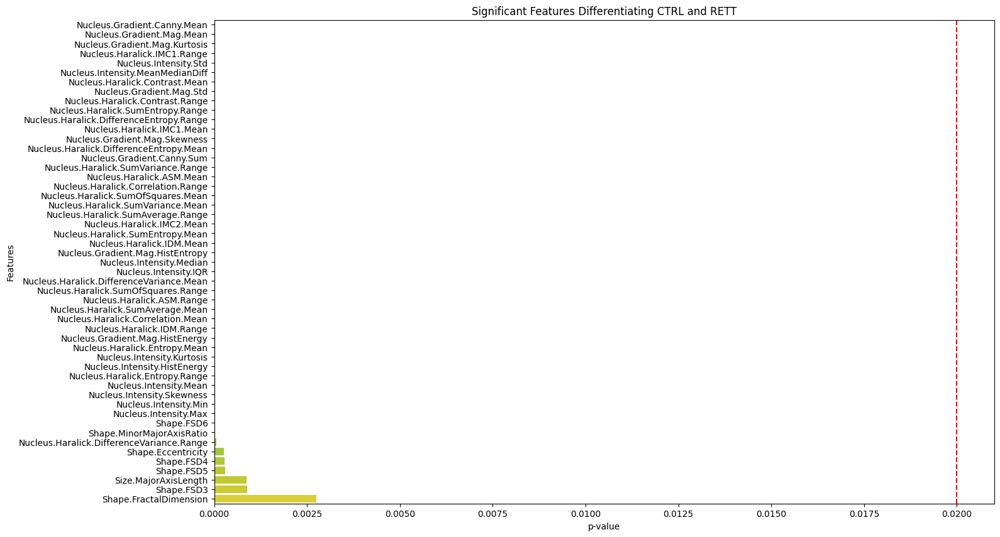

In [11]:
from scipy.stats import ttest_ind
# 初始化存储 p 值的列表
p_values = []

# 进行 t-检验
for column in df_CTRL.columns[:-1]:  # 忽略 'State' 列
    t_stat, p_val = ttest_ind(
        df_CTRL[column], 
        df_RETT[column],
        equal_var=False  # 可以假设不等方差
    )
    p_values.append((column, p_val))

# 将 p 值转化为 DataFrame
p_values_df = pd.DataFrame(p_values, columns=['Feature', 'p_value'])

# 筛选显著特征（例如 p < 0.05）
significant_features = p_values_df[p_values_df['p_value'] < 0.02]

# 按 p 值排序
significant_features = significant_features.sort_values(by='p_value')

# 打印显著特征
print(significant_features)

# 可视化显著特征的 p 值
plt.figure(figsize=(16, 10))
sns.barplot(x='p_value', y='Feature', data=significant_features, palette='viridis')
plt.title('Significant Features Differentiating CTRL and RETT')
plt.xlabel('p-value')
plt.ylabel('Features')
plt.axvline(x=0.02, color='r', linestyle='--')
plt.savefig(f'{loadpath}/{savename}_ttest.png', dpi=300)
plt.show()

# PCA 散点图

                                                   PC1           PC2
Size.Area                                 6.968425e-01 -4.079788e-02
Size.ConvexHullArea                       7.168588e-01  9.671906e-03
Size.MajorAxisLength                      2.352379e-03 -1.191788e-03
Size.MinorAxisLength                      1.646093e-03  1.069473e-03
Size.Perimeter                            6.958302e-03  3.606865e-04
...                                                ...           ...
Nucleus.Haralick.DifferenceEntropy.Mean  -2.436482e-06  1.776825e-04
Nucleus.Haralick.DifferenceEntropy.Range -4.858511e-07  4.423219e-05
Nucleus.Haralick.IMC1.Mean               -5.914157e-07  3.758210e-05
Nucleus.Haralick.IMC1.Range              -1.329611e-07  7.472413e-06
Nucleus.Haralick.IMC2.Mean                1.335766e-08 -1.083787e-07

[62 rows x 2 columns]


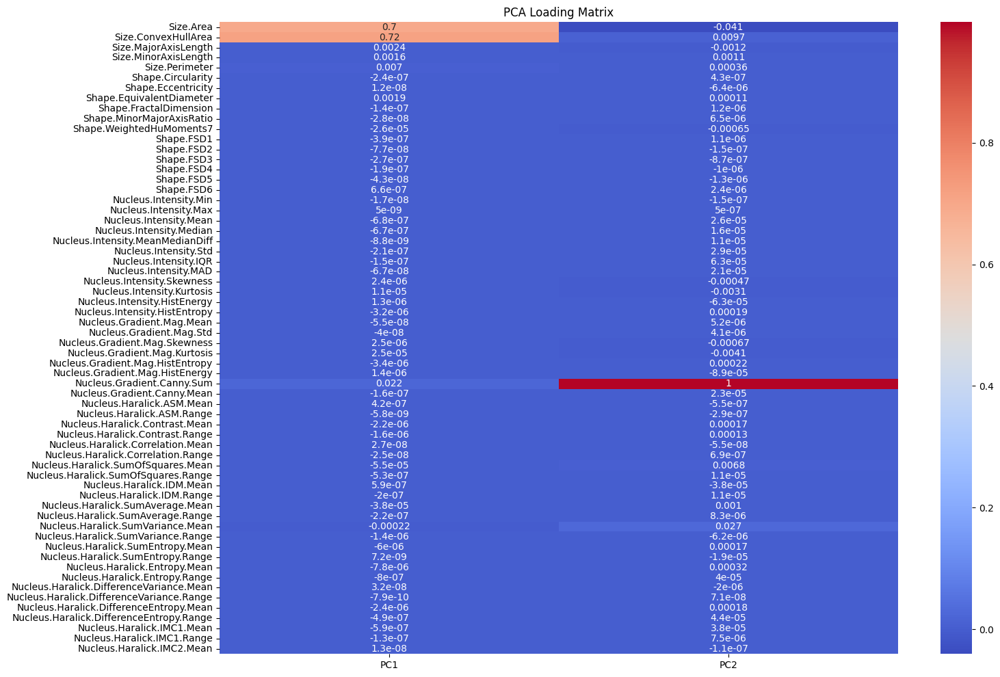

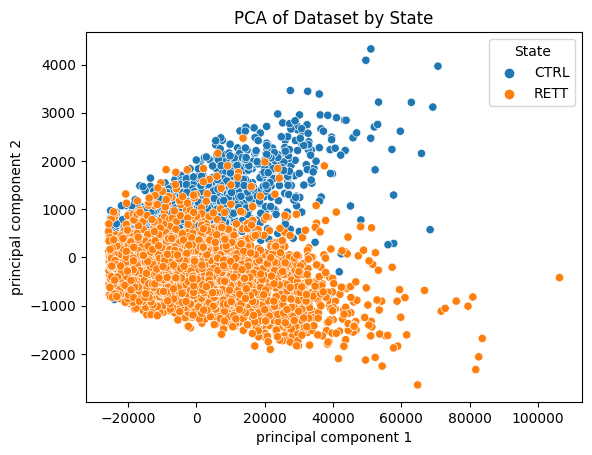

In [12]:
from sklearn.decomposition import PCA
# 提取特征数据
features = df_combined.drop('State', axis=1)

# 应用 PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(features)
principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

# 获取加载矩阵
loading_matrix = pca.components_.T
loading_df = pd.DataFrame(loading_matrix, columns=['PC1', 'PC2'], index=features.columns)

# 查看加载矩阵
print(loading_df)

# 可视化加载矩阵
plt.figure(figsize=(16, 12))
sns.heatmap(loading_df, annot=True, cmap='coolwarm')
plt.title('PCA Loading Matrix')
plt.savefig(f'{loadpath}/{savename}_PCA_Matrix.png', dpi=300)
plt.show()

# 重置索引以确保对齐
state_df = df_combined[['State']].reset_index(drop=True)
finalDf = pd.concat([principalDf, state_df], axis=1)

# 使用 Seaborn 绘制 PCA 结果图
sns.scatterplot(data=finalDf, x='principal component 1', y='principal component 2', hue='State')
plt.title('PCA of Dataset by State')
plt.savefig(f'{loadpath}/{savename}_PCA.png', dpi=300)
plt.show()

# t-SNE

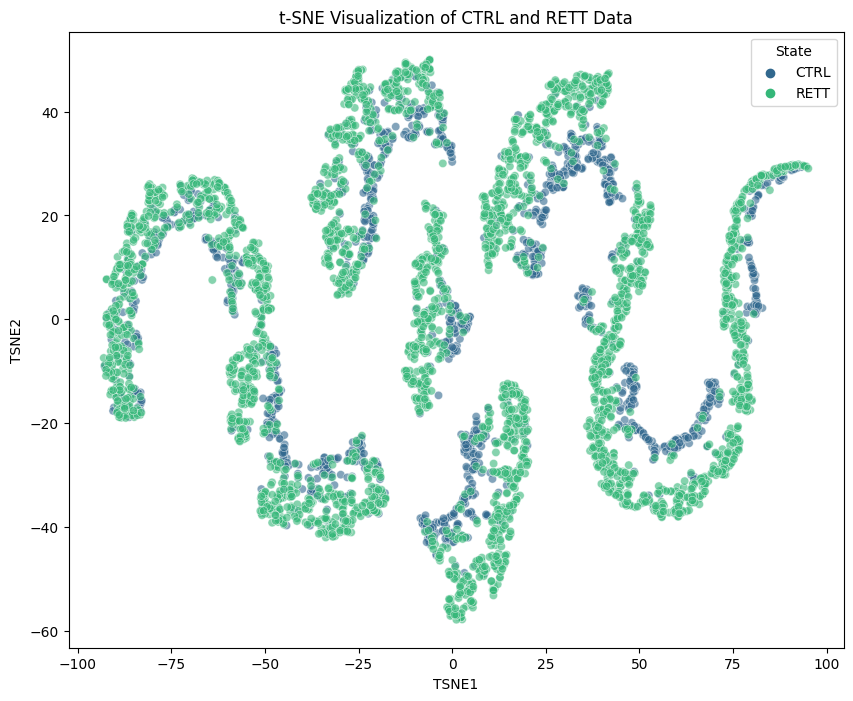

In [13]:
from sklearn.manifold import TSNE

# 应用 t-SNE
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(df_combined.drop('State', axis=1))

# 重置索引，确保索引的一致性
tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2']).reset_index(drop=True)
state_df = df_combined['State'].reset_index(drop=True)

# 合并 t-SNE 结果和状态标签
final_df = pd.concat([tsne_df, state_df], axis=1)

# 绘制结果
plt.figure(figsize=(10, 8))
sns.scatterplot(x='TSNE1', y='TSNE2', hue='State', data=final_df, palette='viridis', alpha=0.6)
plt.title('t-SNE Visualization of CTRL and RETT Data')

plt.savefig(f'{loadpath}/{savename}_tSNE.png', dpi=300)
plt.show()

# BOX 箱型图

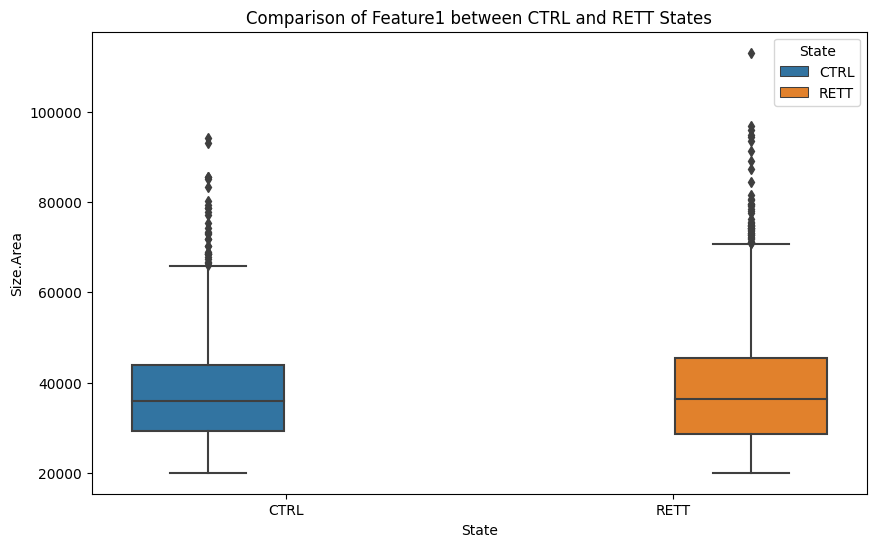

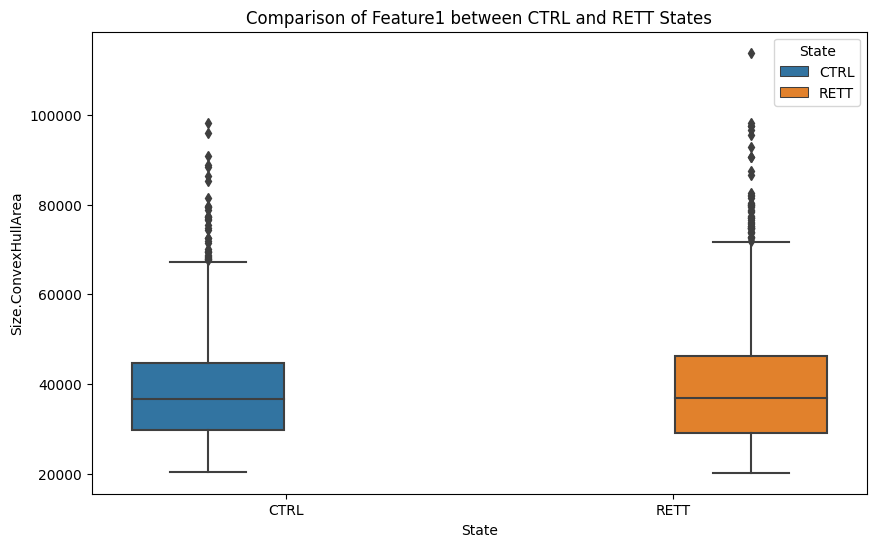

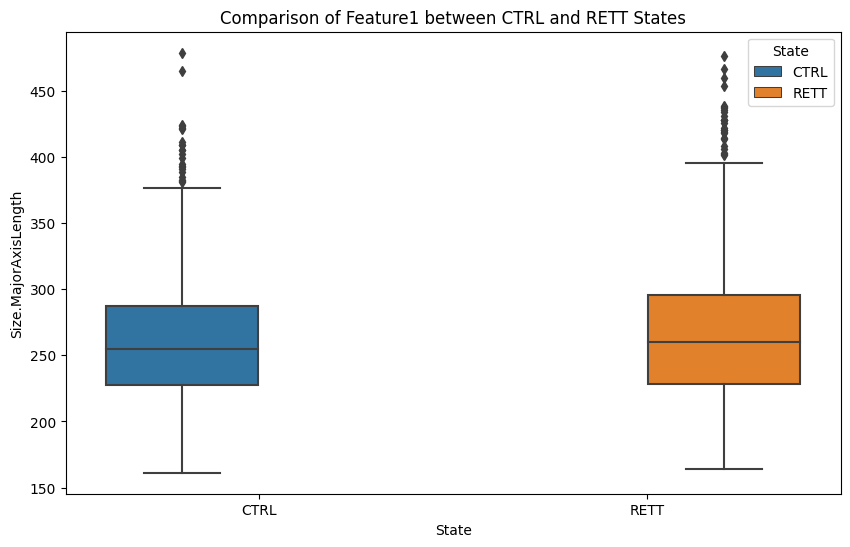

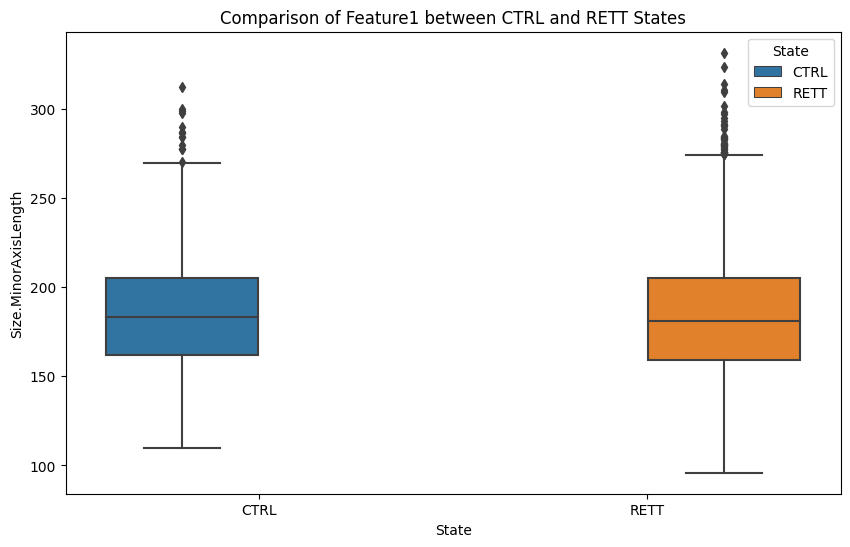

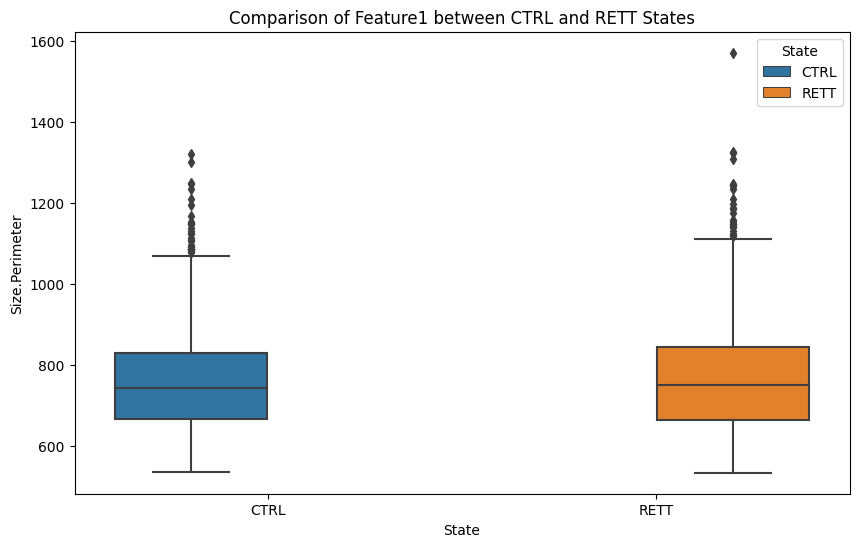

...

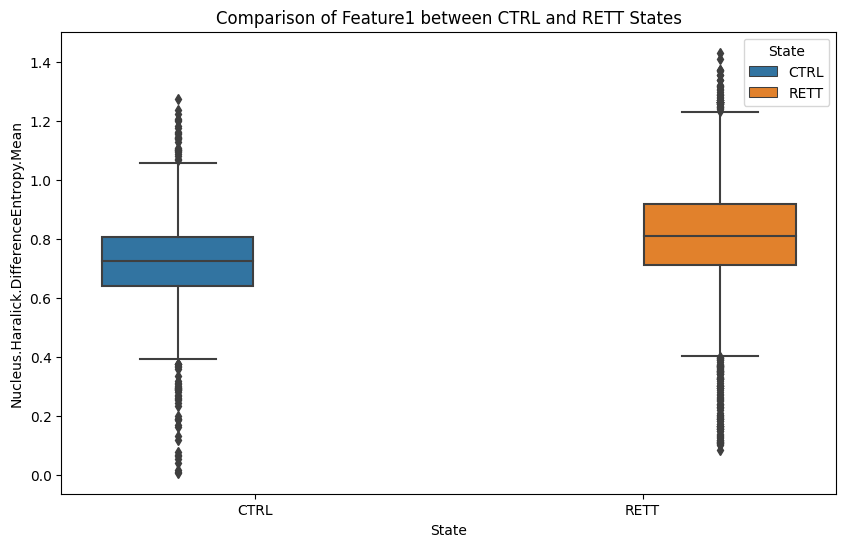

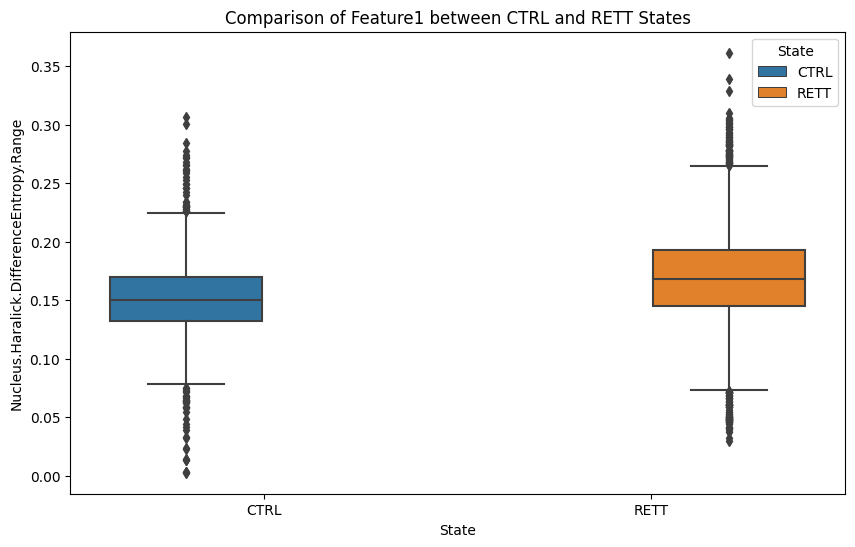

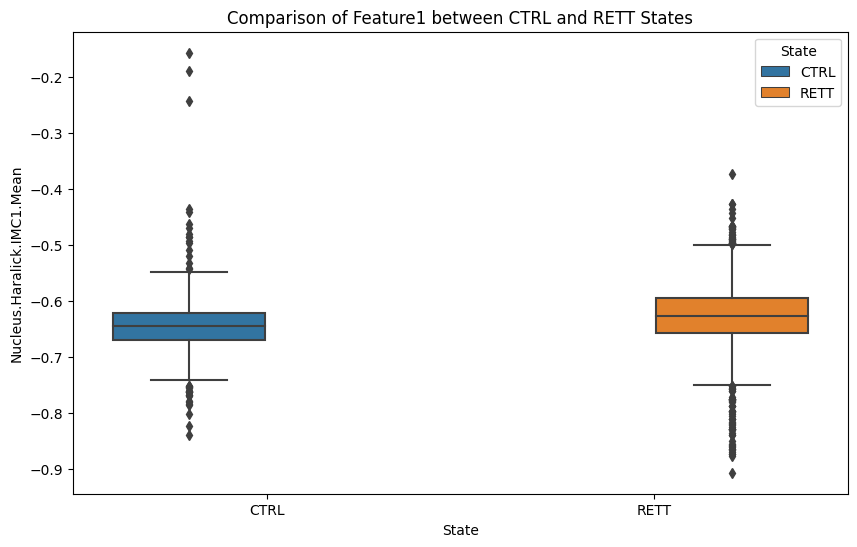

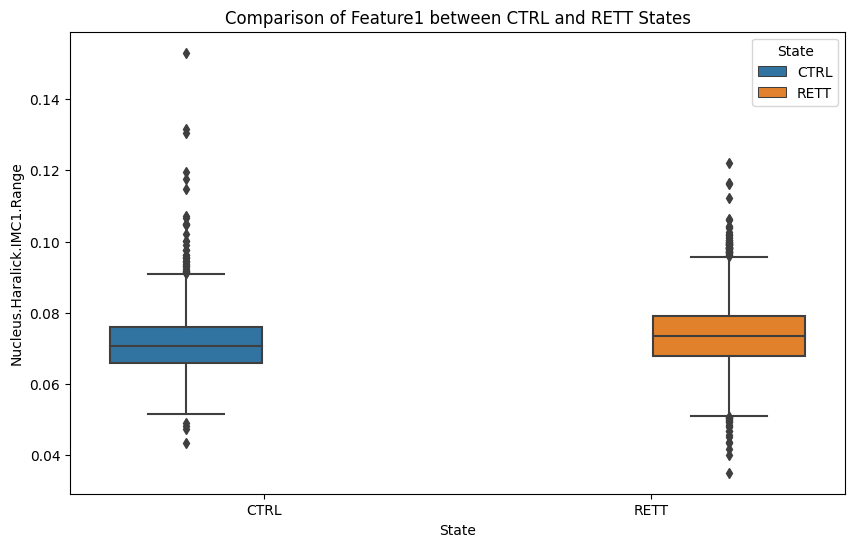

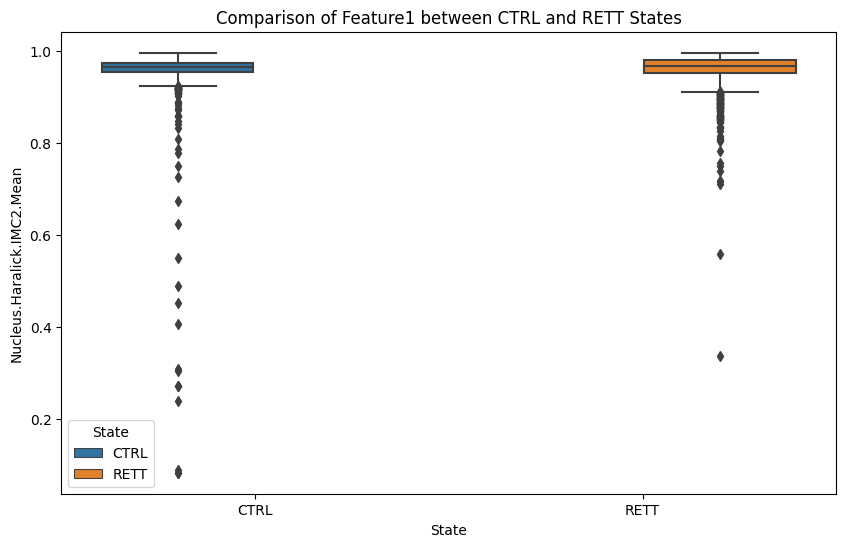

In [30]:
# 箱型图比较两个状态下的一个特征
for feature in features:
    plt.figure(figsize=(10, 6))
    sns.boxplot(data=df_combined, x='State', y=feature, hue='State')  # 替换 'Feature1' 为具体特征名
    plt.title('Comparison of Feature1 between CTRL and RETT States')
    plt.legend(title='State')
    plt.show()

# # 小提琴图
# plt.figure(figsize=(12, 6))
# sns.violinplot(data=df, x='feature_column', y='value_column', hue='State', split=True)
# plt.title('Violin Plot of Features by State')
# plt.show()

# # 平行坐标图
# from pandas.plotting import parallel_coordinates
# plt.figure(figsize=(12, 6))
# parallel_coordinates(df, 'State', colormap=plt.get_cmap("Set1"))
# plt.title('Parallel Coordinates Plot by State')
# plt.show()

🌸 Feature_GradCAM/features_RETT_All_Resnet10_noavg_GradCAM.csv
🌼 Feature_GradCAM/features_CTRL_All_Resnet10_noavg_GradCAM.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
61                 Nucleus.Haralick.IMC2.Mean   0.000000e+00
37                  Nucleus.Haralick.ASM.Mean   0.000000e+00
30                   Nucleus.Gradient.Mag.Std   0.000000e+00
38                 Nucleus.Haralick.ASM.Range   0.000000e+00
28              Nucleus.Intensity.HistEntropy   0.000000e+00
27               Nucleus.Intensity.HistEnergy   0.000000e+00
24                      Nucleus.Intensity.MAD   0.000000e+00
41          Nucleus.Haralick.Correlation.Mean   0.000000e+00
20                   Nucleus.Intensity.Median   0.000000e+00
19                     Nucleus.Intensity.Mean   0.000000e+00
60                Nucleus.Haralick.IMC1.Range   0.000000e+00
47           Nucleus.Harali

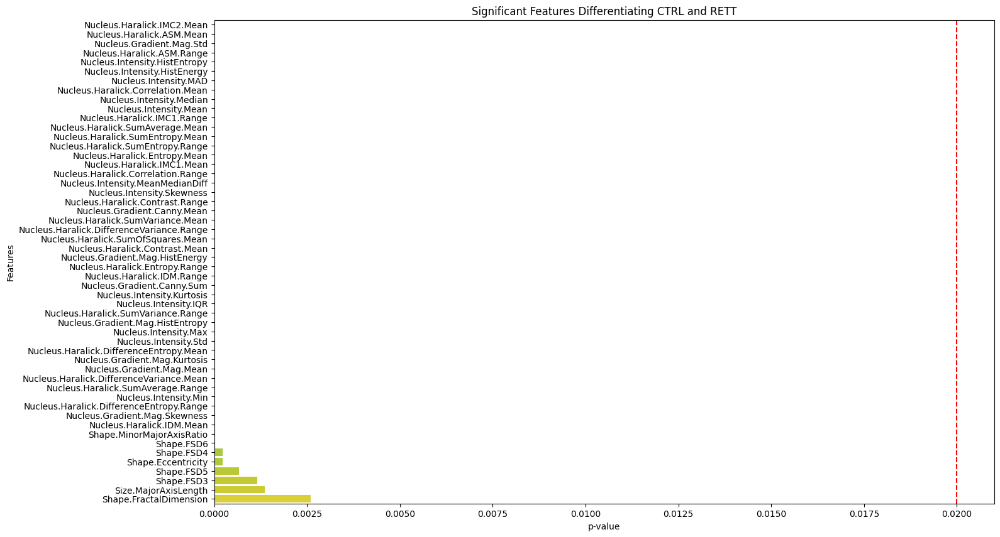

####################################################
####################################################
🛎️ PCA


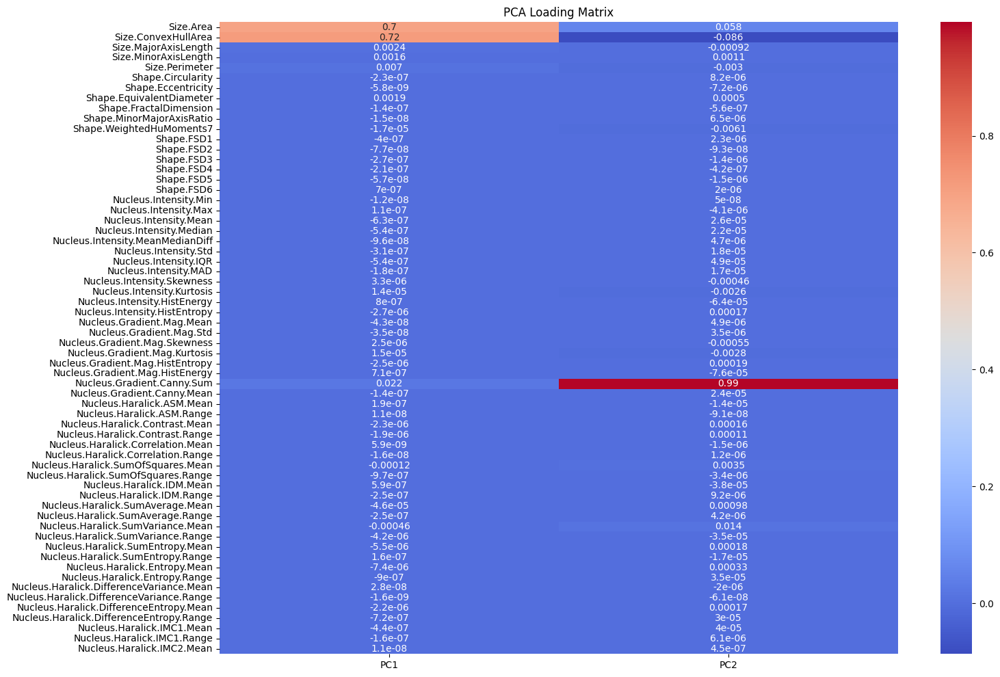

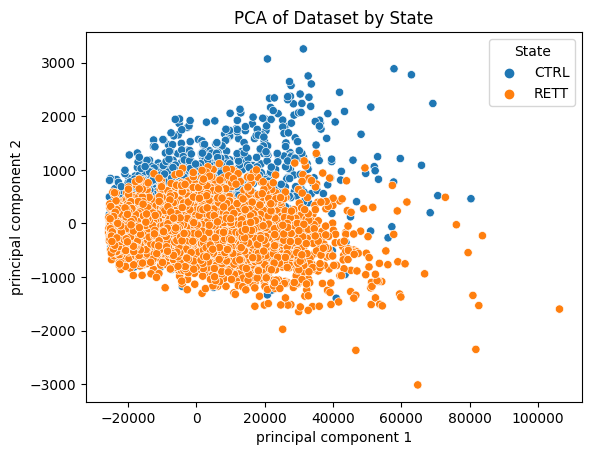

####################################################
####################################################
🛎️ t-SNE


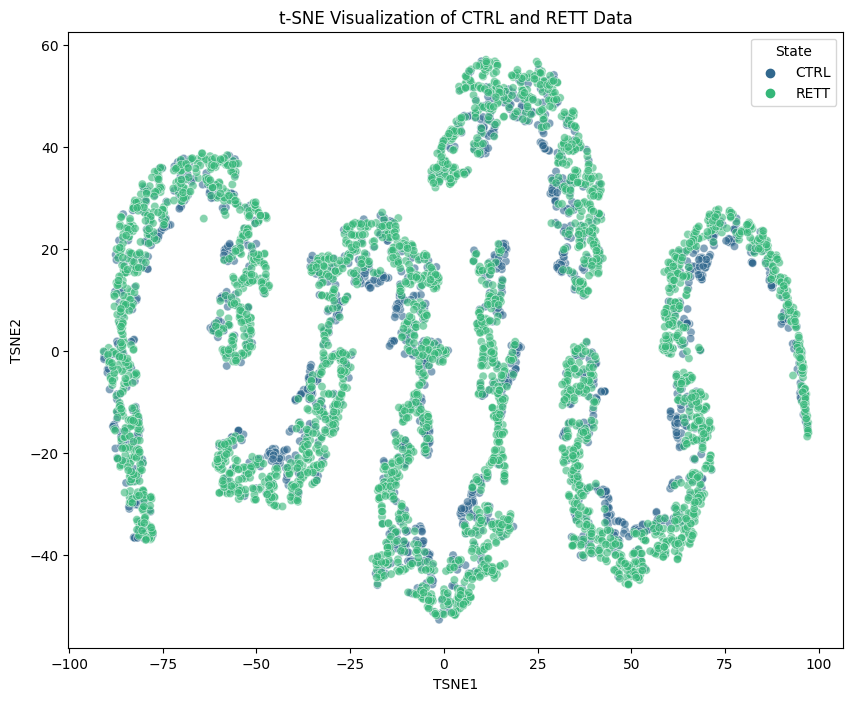

🌸 Feature_GradCAM/features_RETT_H3K27ac_Resnet10_noavg_GradCAM.csv
🌼 Feature_GradCAM/features_CTRL_H3K27ac_Resnet10_noavg_GradCAM.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
36                Nucleus.Gradient.Canny.Mean   0.000000e+00
29                  Nucleus.Gradient.Mag.Mean   0.000000e+00
32              Nucleus.Gradient.Mag.Kurtosis   0.000000e+00
60                Nucleus.Haralick.IMC1.Range   0.000000e+00
22                      Nucleus.Intensity.Std   0.000000e+00
21           Nucleus.Intensity.MeanMedianDiff   0.000000e+00
39             Nucleus.Haralick.Contrast.Mean   0.000000e+00
30                   Nucleus.Gradient.Mag.Std   0.000000e+00
40            Nucleus.Haralick.Contrast.Range   0.000000e+00
52          Nucleus.Haralick.SumEntropy.Range   0.000000e+00
58   Nucleus.Haralick.DifferenceEntropy.Range   0.000000e+00
59                 

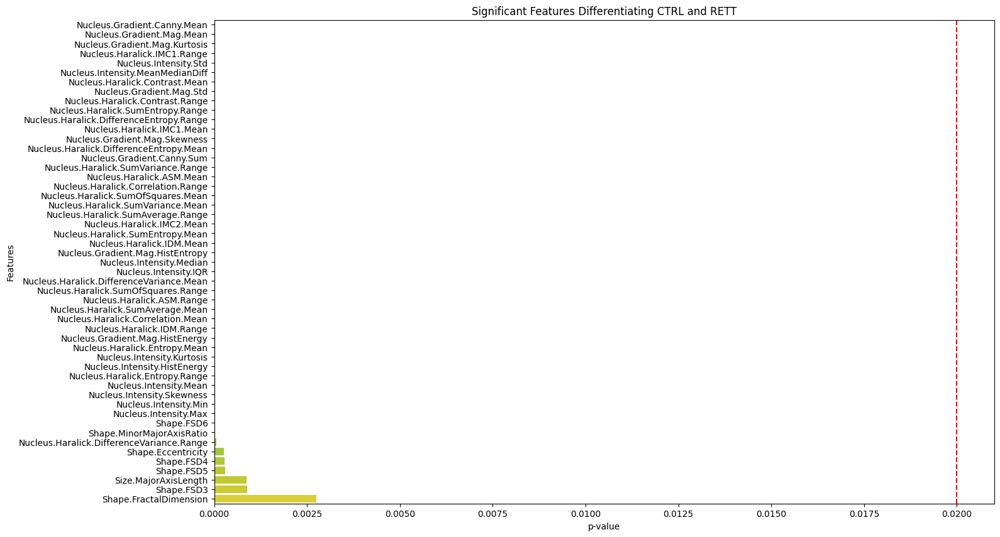

####################################################
####################################################
🛎️ PCA


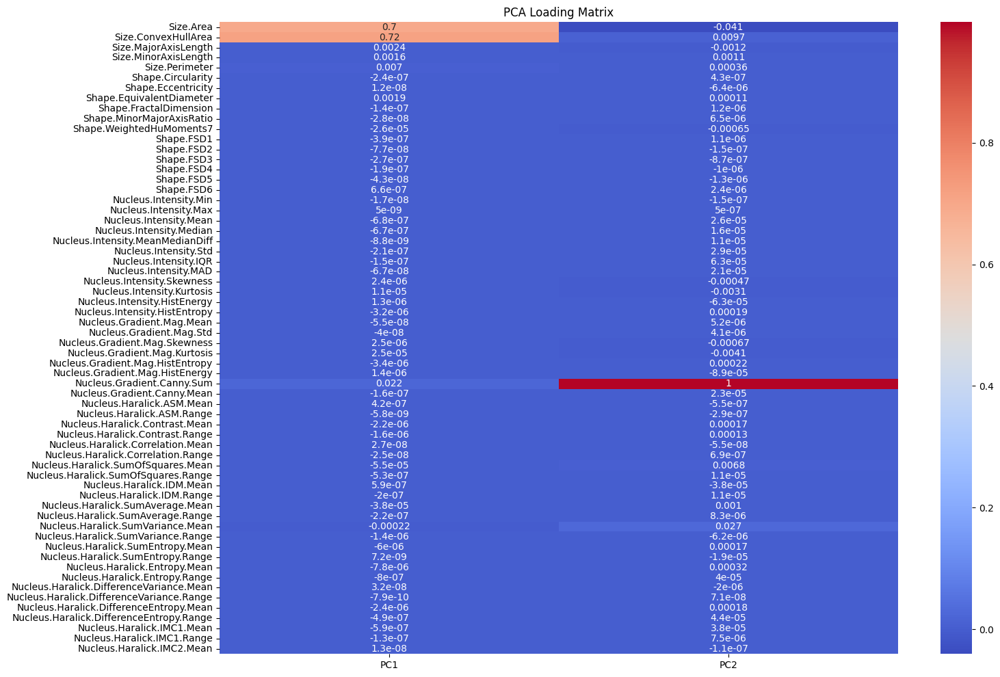

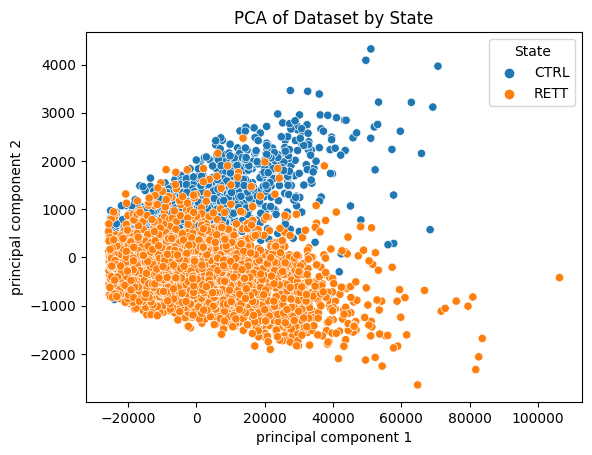

####################################################
####################################################
🛎️ t-SNE


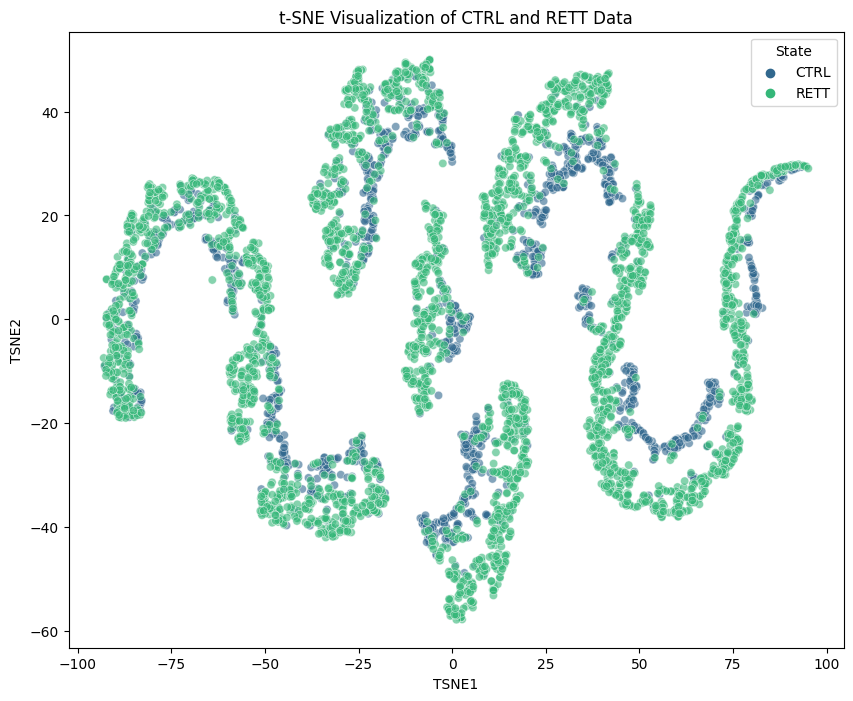

🌸 Feature_GradCAM/features_RETT_CTCF_Resnet10_noavg_GradCAM.csv
🌼 Feature_GradCAM/features_CTRL_CTCF_Resnet10_noavg_GradCAM.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
61                 Nucleus.Haralick.IMC2.Mean   0.000000e+00
46                 Nucleus.Haralick.IDM.Range   0.000000e+00
47           Nucleus.Haralick.SumAverage.Mean   0.000000e+00
38                 Nucleus.Haralick.ASM.Range   0.000000e+00
37                  Nucleus.Haralick.ASM.Mean   0.000000e+00
34            Nucleus.Gradient.Mag.HistEnergy   0.000000e+00
33           Nucleus.Gradient.Mag.HistEntropy   0.000000e+00
48          Nucleus.Haralick.SumAverage.Range   0.000000e+00
30                   Nucleus.Gradient.Mag.Std   0.000000e+00
28              Nucleus.Intensity.HistEntropy   0.000000e+00
27               Nucleus.Intensity.HistEnergy   0.000000e+00
25                 Nucleu

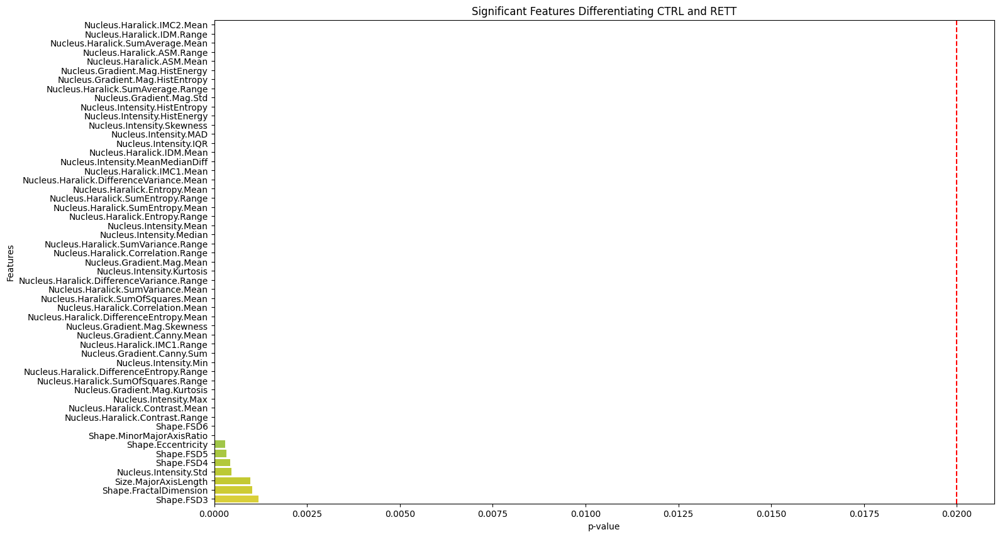

####################################################
####################################################
🛎️ PCA


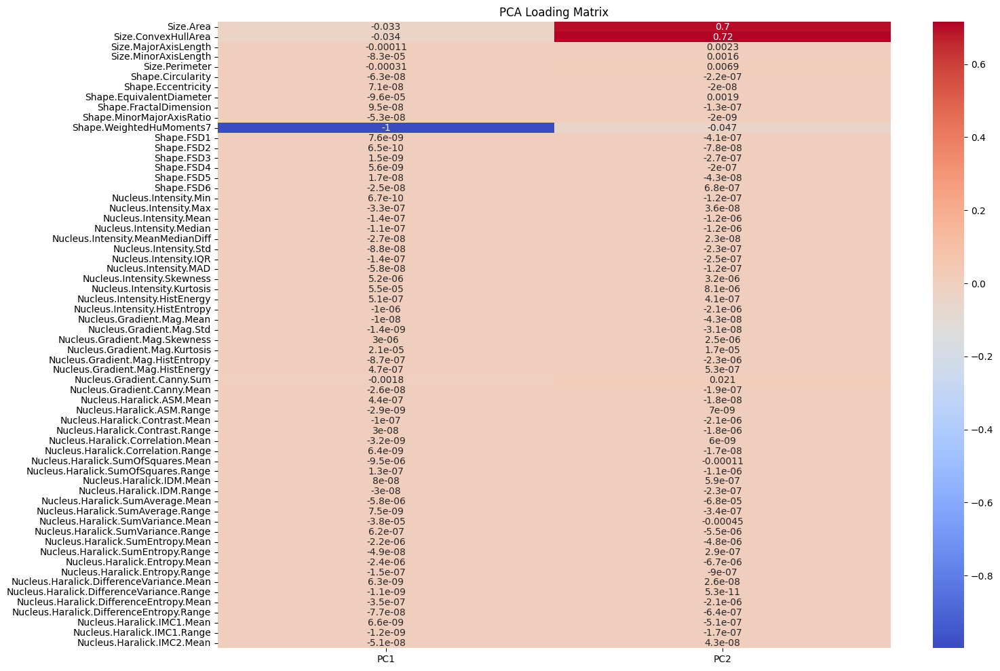

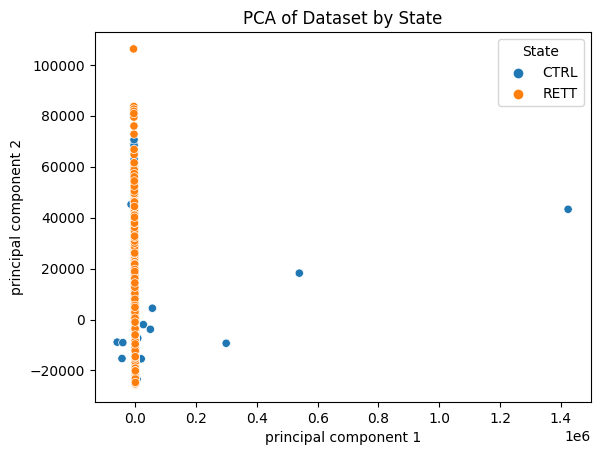

####################################################
####################################################
🛎️ t-SNE


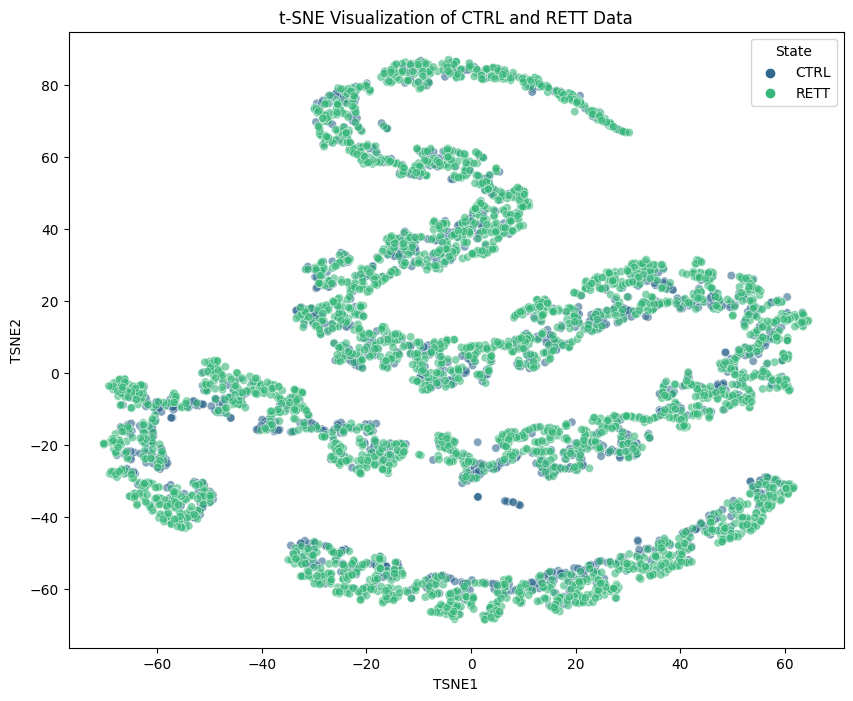

🌸 Feature_GradCAM/features_RETT_Dapi_Resnet10_noavg_GradCAM.csv
🌼 Feature_GradCAM/features_CTRL_Dapi_Resnet10_noavg_GradCAM.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
34            Nucleus.Gradient.Mag.HistEnergy   0.000000e+00
36                Nucleus.Gradient.Canny.Mean   0.000000e+00
37                  Nucleus.Haralick.ASM.Mean   0.000000e+00
41          Nucleus.Haralick.Correlation.Mean   0.000000e+00
42         Nucleus.Haralick.Correlation.Range   0.000000e+00
43         Nucleus.Haralick.SumOfSquares.Mean   0.000000e+00
44        Nucleus.Haralick.SumOfSquares.Range   0.000000e+00
45                  Nucleus.Haralick.IDM.Mean   0.000000e+00
46                 Nucleus.Haralick.IDM.Range   0.000000e+00
47           Nucleus.Haralick.SumAverage.Mean   0.000000e+00
48          Nucleus.Haralick.SumAverage.Range   0.000000e+00
49          Nucleus.Haral

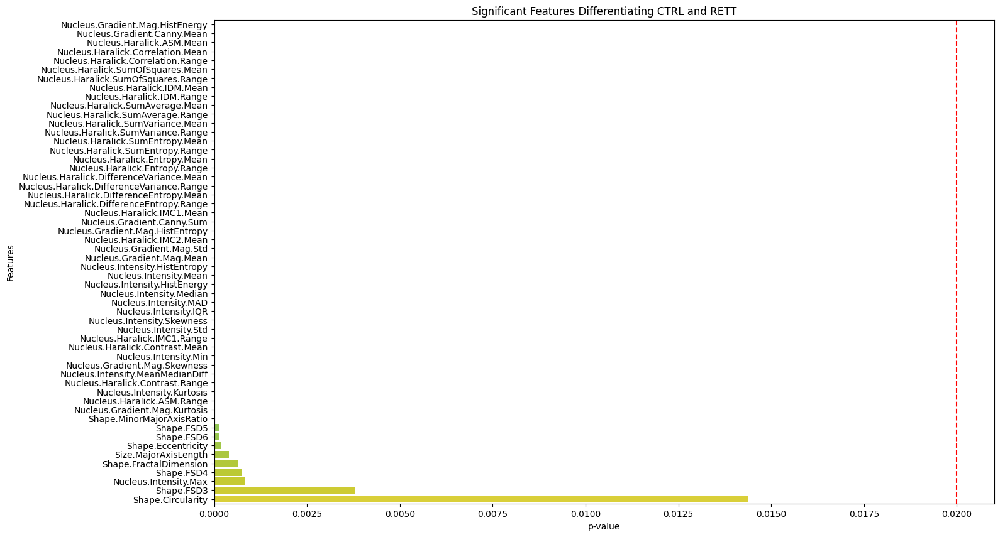

####################################################
####################################################
🛎️ PCA


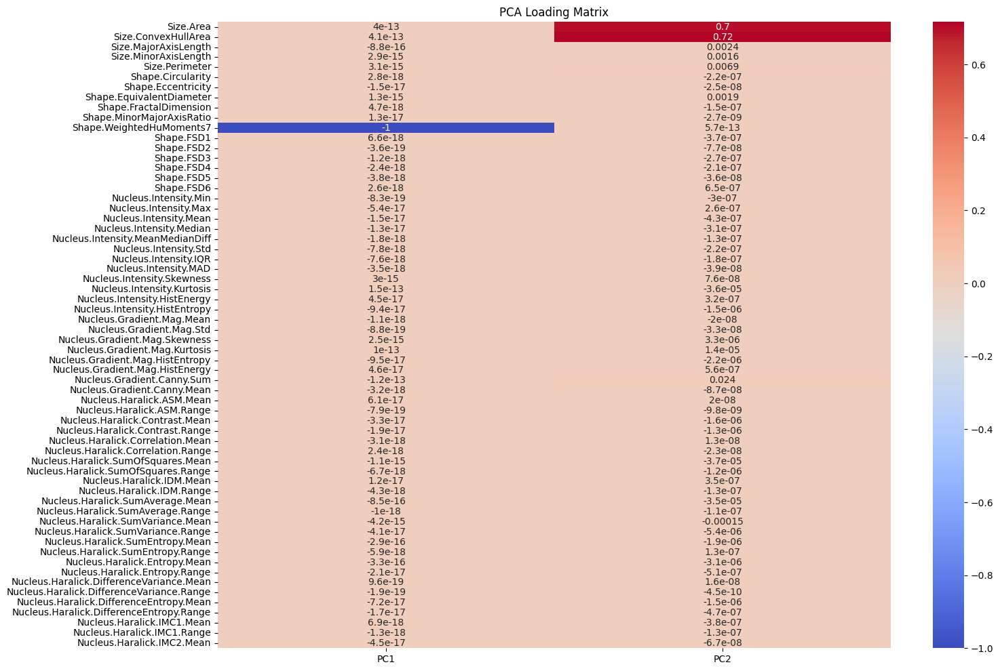

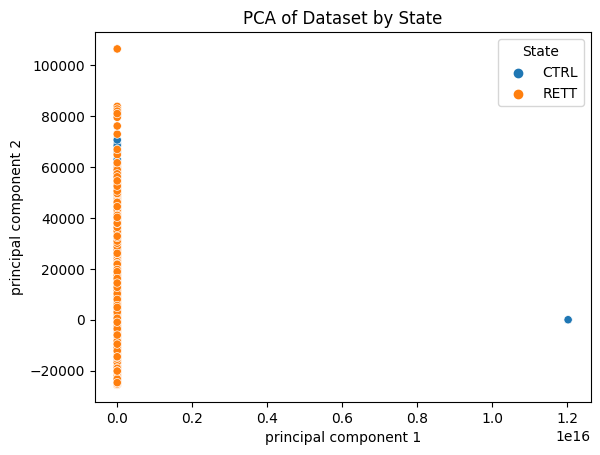

####################################################
####################################################
🛎️ t-SNE


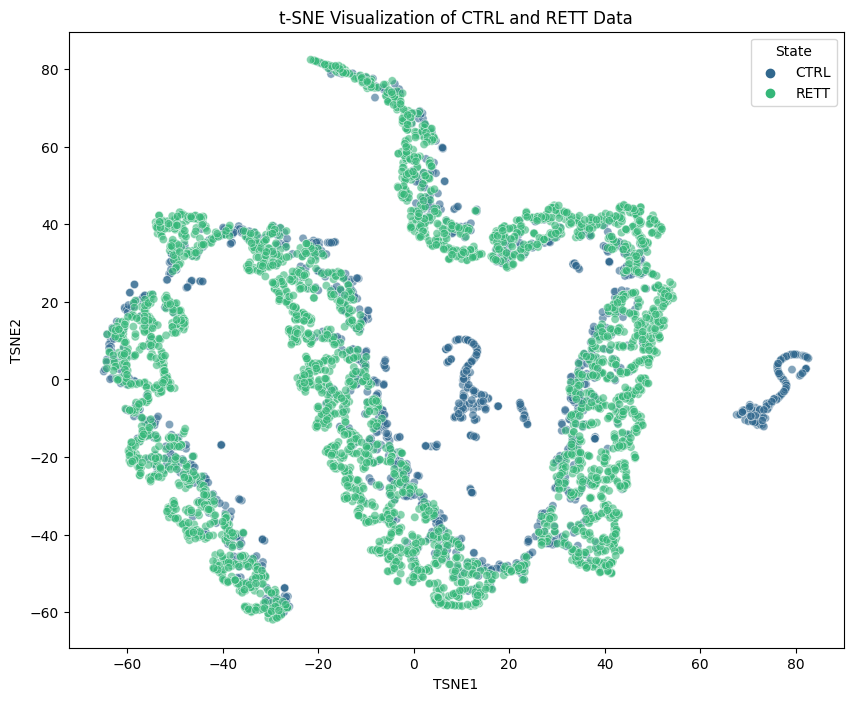

🌸 Feature_ScoreCAM/features_RETT_All_Resnet10_noavg_ScoreCAM.csv
🌼 Feature_ScoreCAM/features_CTRL_All_Resnet10_noavg_ScoreCAM.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
34            Nucleus.Gradient.Mag.HistEnergy   0.000000e+00
53              Nucleus.Haralick.Entropy.Mean   0.000000e+00
51           Nucleus.Haralick.SumEntropy.Mean   0.000000e+00
48          Nucleus.Haralick.SumAverage.Range   0.000000e+00
47           Nucleus.Haralick.SumAverage.Mean   0.000000e+00
38                 Nucleus.Haralick.ASM.Range   0.000000e+00
37                  Nucleus.Haralick.ASM.Mean   0.000000e+00
36                Nucleus.Gradient.Canny.Mean   0.000000e+00
33           Nucleus.Gradient.Mag.HistEntropy   0.000000e+00
31              Nucleus.Gradient.Mag.Skewness   0.000000e+00
28              Nucleus.Intensity.HistEntropy   0.000000e+00
27               Nucleu

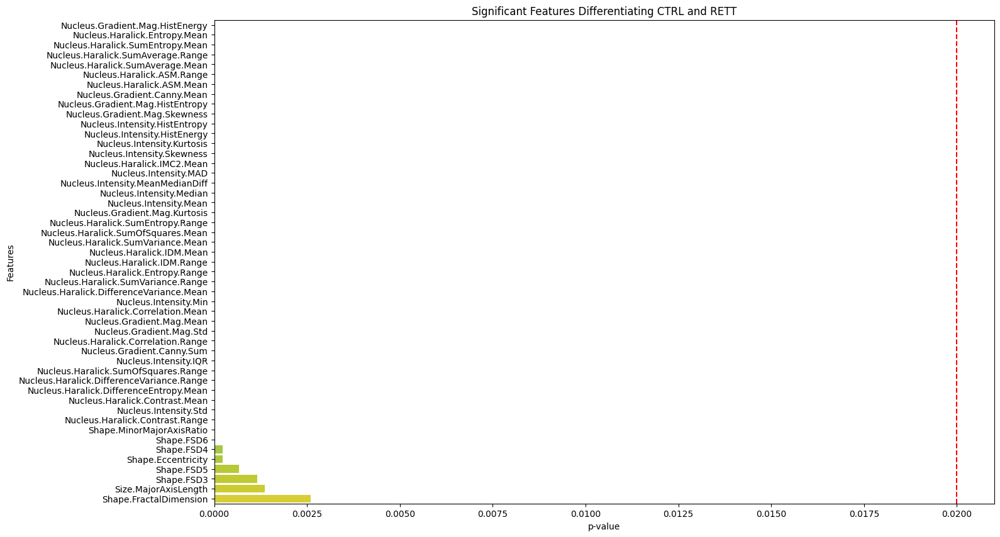

####################################################
####################################################
🛎️ PCA


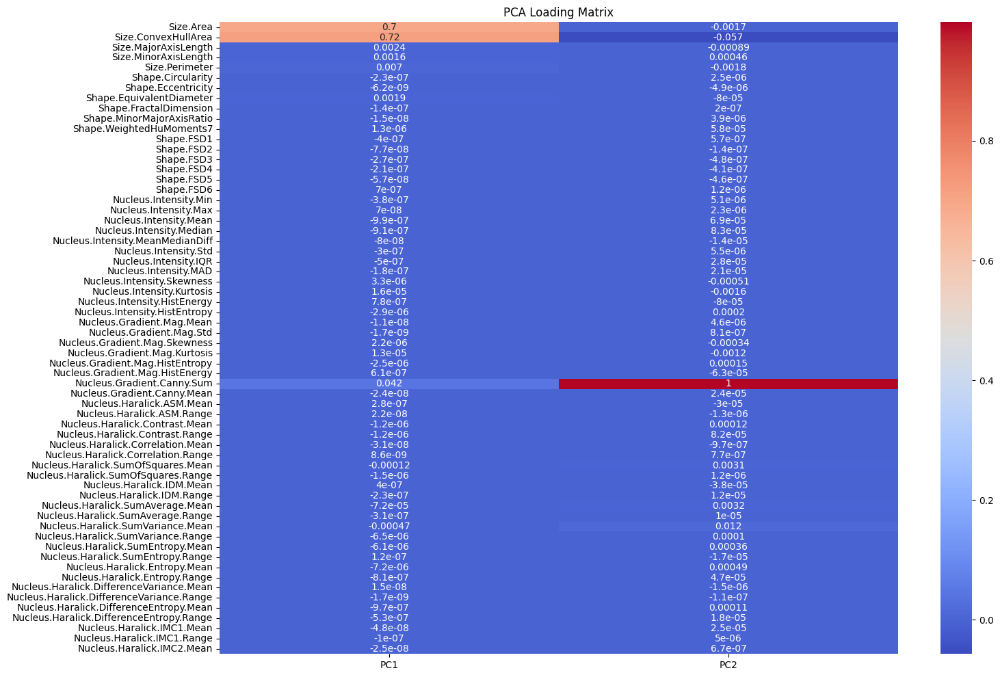

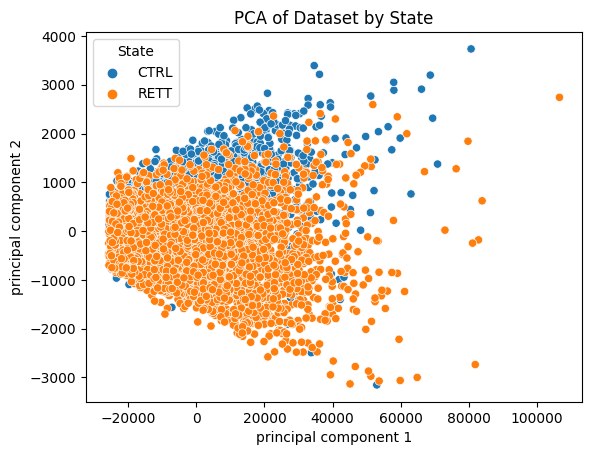

####################################################
####################################################
🛎️ t-SNE


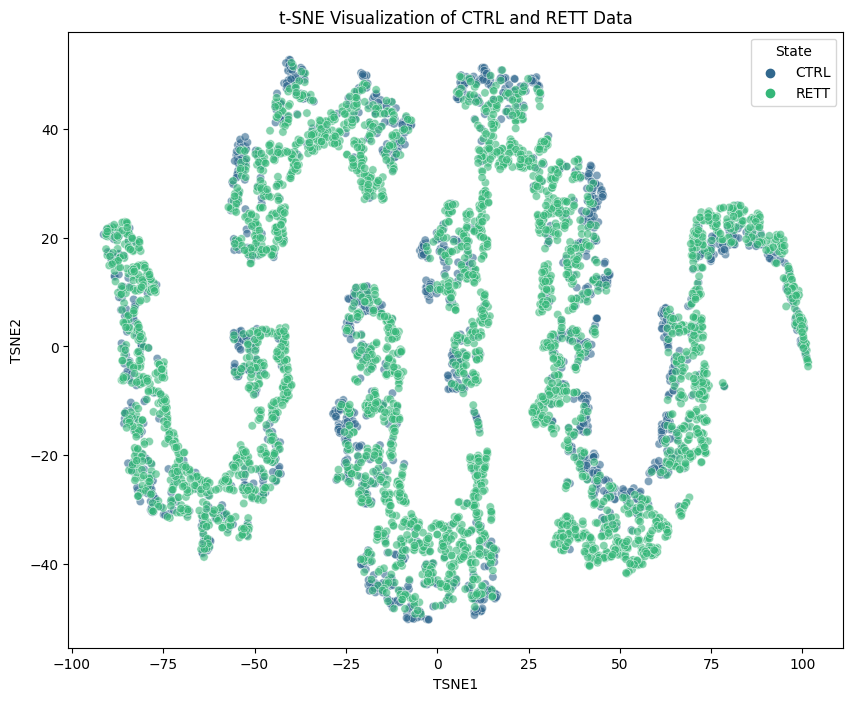

🌸 Feature_ScoreCAM/features_RETT_H3K27ac_Resnet10_noavg_ScoreCAM.csv
🌼 Feature_ScoreCAM/features_CTRL_H3K27ac_Resnet10_noavg_ScoreCAM.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
35                 Nucleus.Gradient.Canny.Sum   0.000000e+00
55   Nucleus.Haralick.DifferenceVariance.Mean   0.000000e+00
54             Nucleus.Haralick.Entropy.Range   0.000000e+00
53              Nucleus.Haralick.Entropy.Mean   0.000000e+00
52          Nucleus.Haralick.SumEntropy.Range   0.000000e+00
46                 Nucleus.Haralick.IDM.Range   0.000000e+00
45                  Nucleus.Haralick.IDM.Mean   0.000000e+00
42         Nucleus.Haralick.Correlation.Range   0.000000e+00
40            Nucleus.Haralick.Contrast.Range   0.000000e+00
39             Nucleus.Haralick.Contrast.Mean   0.000000e+00
36                Nucleus.Gradient.Canny.Mean   0.000000e+00
30             

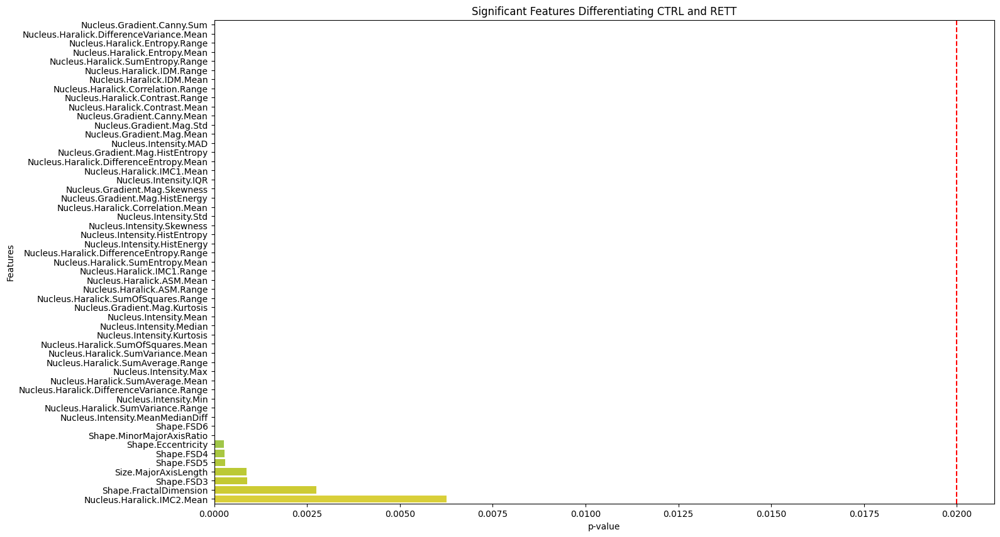

####################################################
####################################################
🛎️ PCA


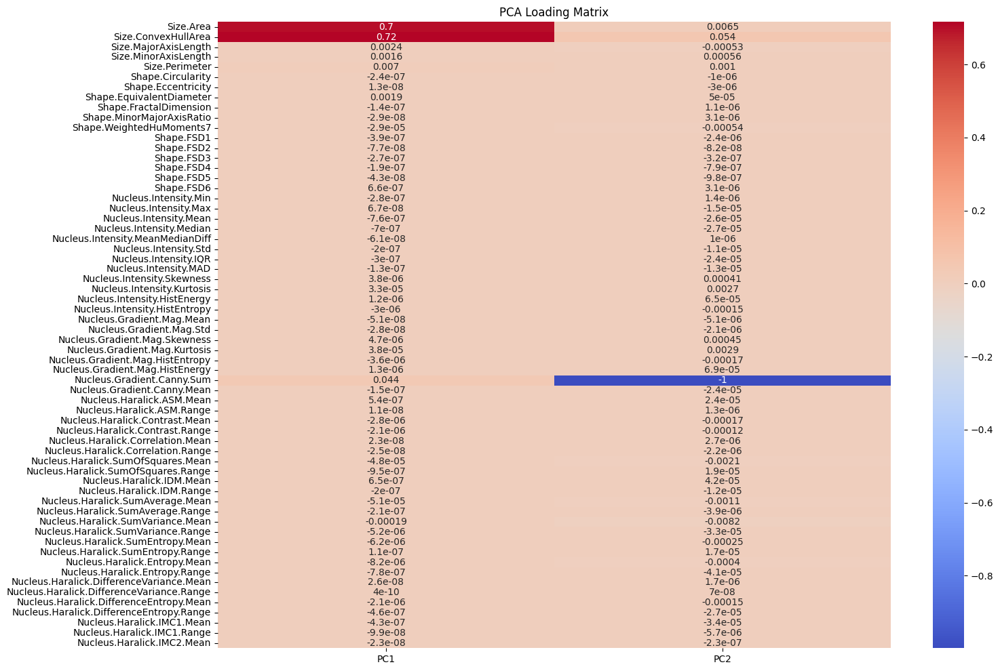

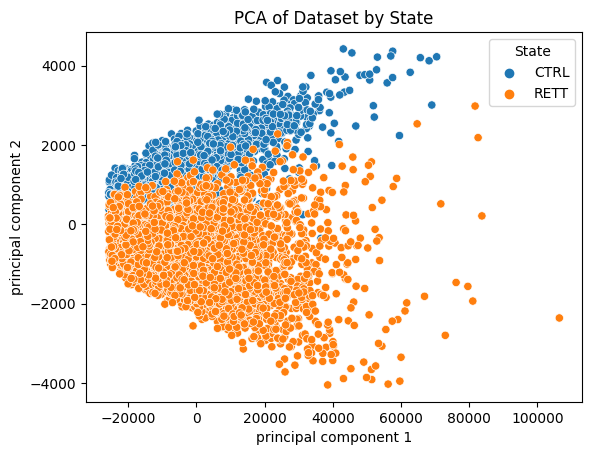

####################################################
####################################################
🛎️ t-SNE


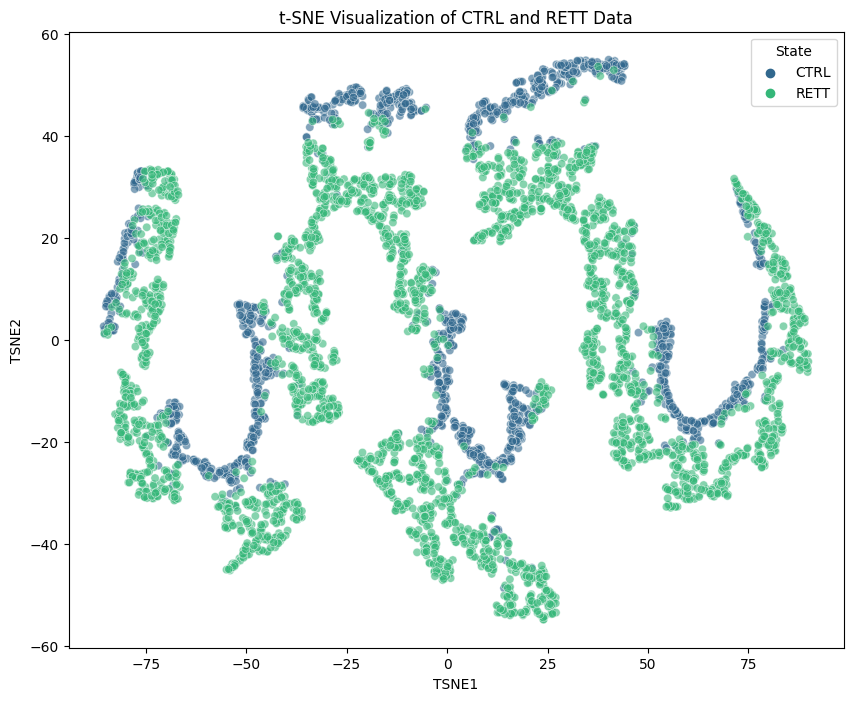

🌸 Feature_ScoreCAM/features_RETT_CTCF_Resnet10_noavg_ScoreCAM.csv
🌼 Feature_ScoreCAM/features_CTRL_CTCF_Resnet10_noavg_ScoreCAM.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
61                 Nucleus.Haralick.IMC2.Mean   0.000000e+00
22                      Nucleus.Intensity.Std   0.000000e+00
27               Nucleus.Intensity.HistEnergy   0.000000e+00
28              Nucleus.Intensity.HistEntropy   0.000000e+00
42         Nucleus.Haralick.Correlation.Range   0.000000e+00
43         Nucleus.Haralick.SumOfSquares.Mean   0.000000e+00
41          Nucleus.Haralick.Correlation.Mean   0.000000e+00
49          Nucleus.Haralick.SumVariance.Mean   0.000000e+00
51           Nucleus.Haralick.SumEntropy.Mean   0.000000e+00
23                      Nucleus.Intensity.IQR  9.423371e-304
24                      Nucleus.Intensity.MAD  5.719682e-283
59                 Nu

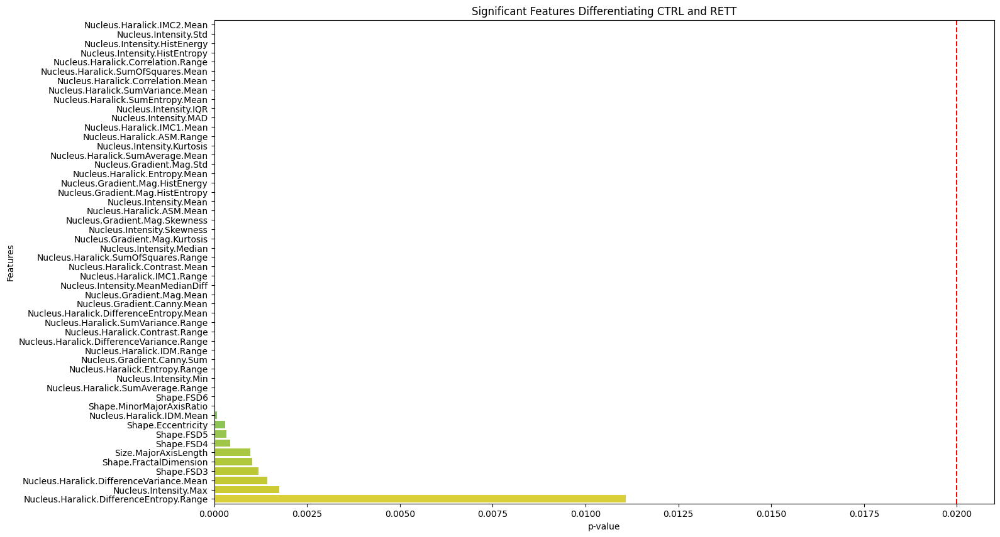

####################################################
####################################################
🛎️ PCA


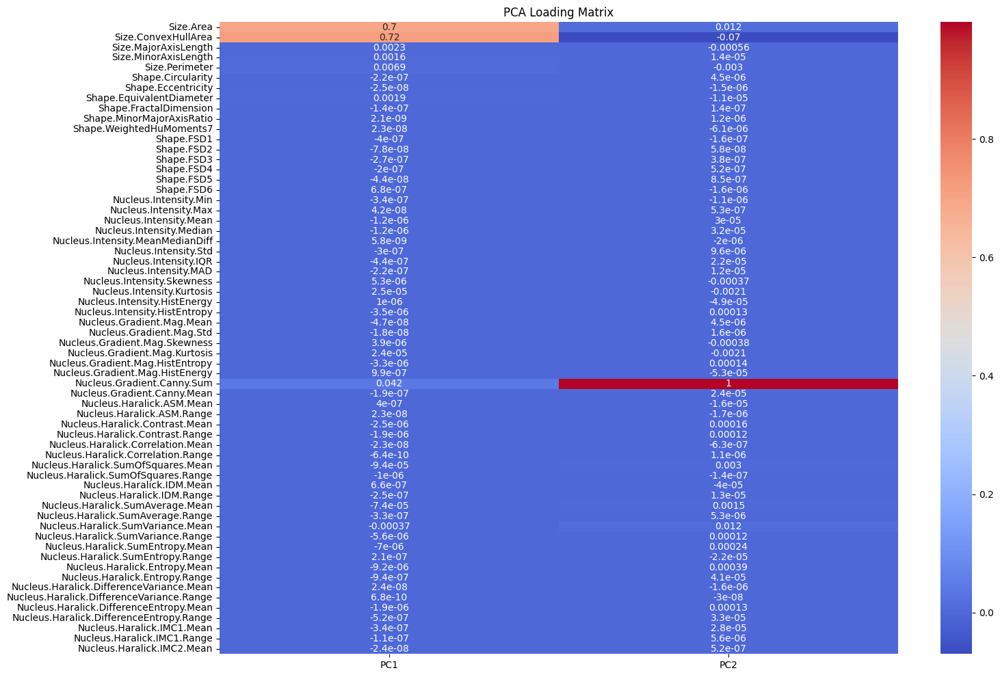

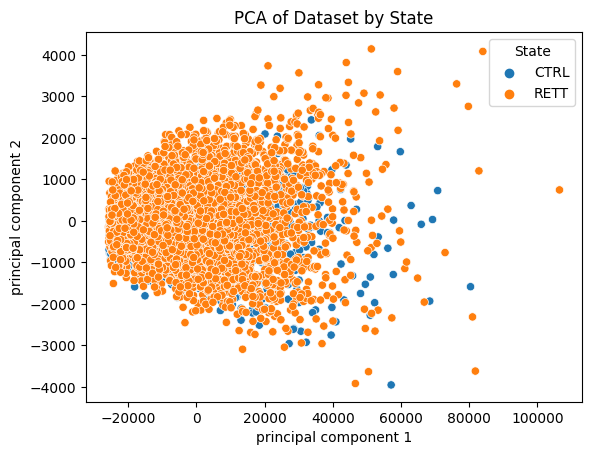

####################################################
####################################################
🛎️ t-SNE


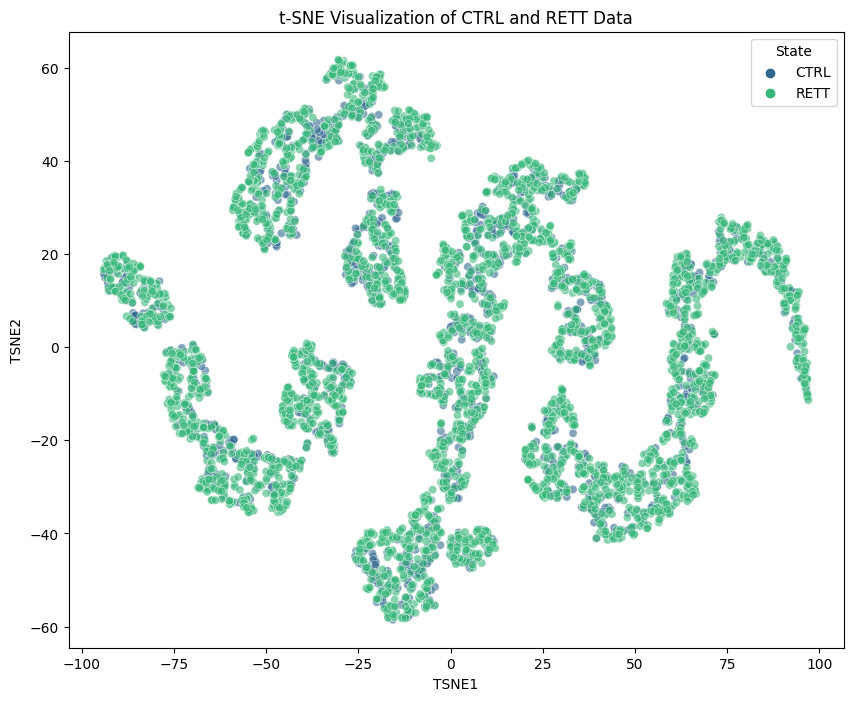

🌸 Feature_ScoreCAM/features_RETT_Dapi_Resnet10_noavg_ScoreCAM.csv
🌼 Feature_ScoreCAM/features_CTRL_Dapi_Resnet10_noavg_ScoreCAM.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
51           Nucleus.Haralick.SumEntropy.Mean   0.000000e+00
47           Nucleus.Haralick.SumAverage.Mean   0.000000e+00
19                     Nucleus.Intensity.Mean   0.000000e+00
20                   Nucleus.Intensity.Median   0.000000e+00
25                 Nucleus.Intensity.Skewness   0.000000e+00
27               Nucleus.Intensity.HistEnergy  1.071046e-298
28              Nucleus.Intensity.HistEntropy  2.049200e-297
53              Nucleus.Haralick.Entropy.Mean  2.332076e-293
38                 Nucleus.Haralick.ASM.Range  6.561468e-262
34            Nucleus.Gradient.Mag.HistEnergy  1.221428e-259
37                  Nucleus.Haralick.ASM.Mean  5.007868e-243
33           Nucleus.

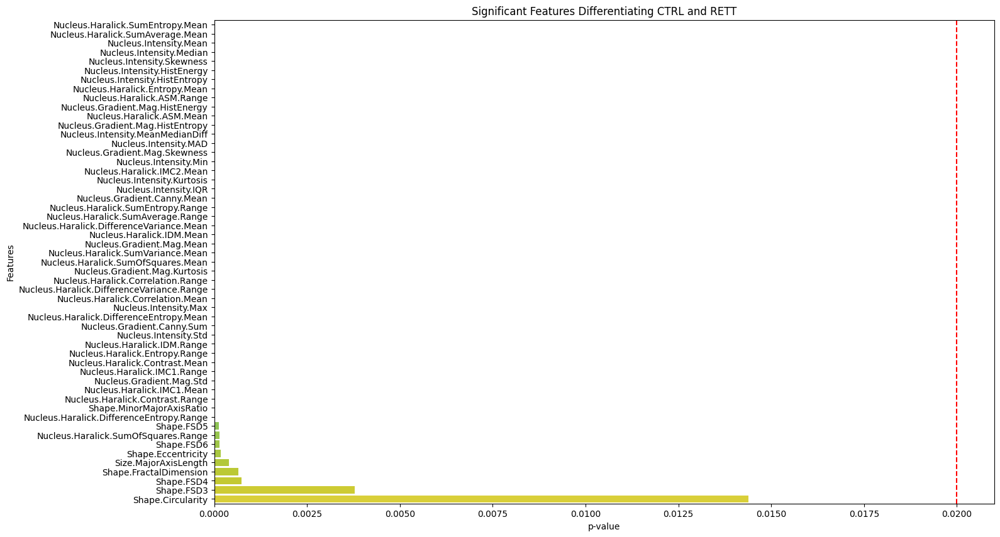

####################################################
####################################################
🛎️ PCA


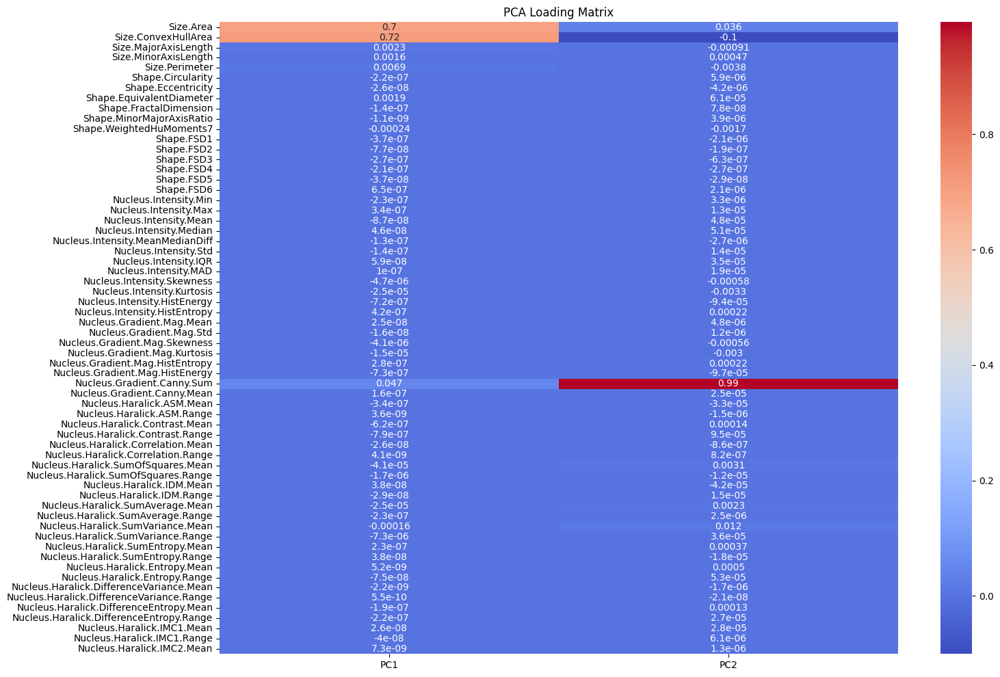

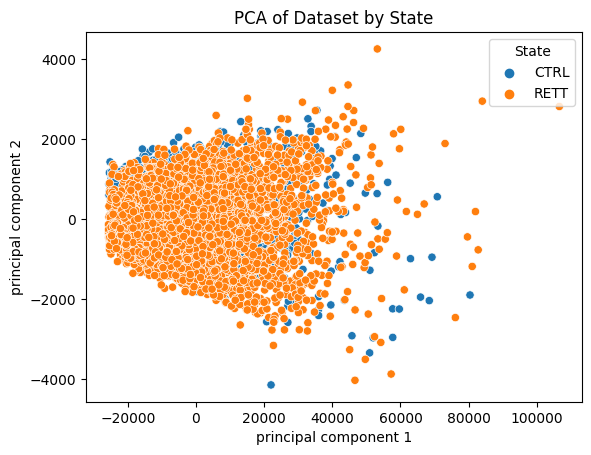

####################################################
####################################################
🛎️ t-SNE


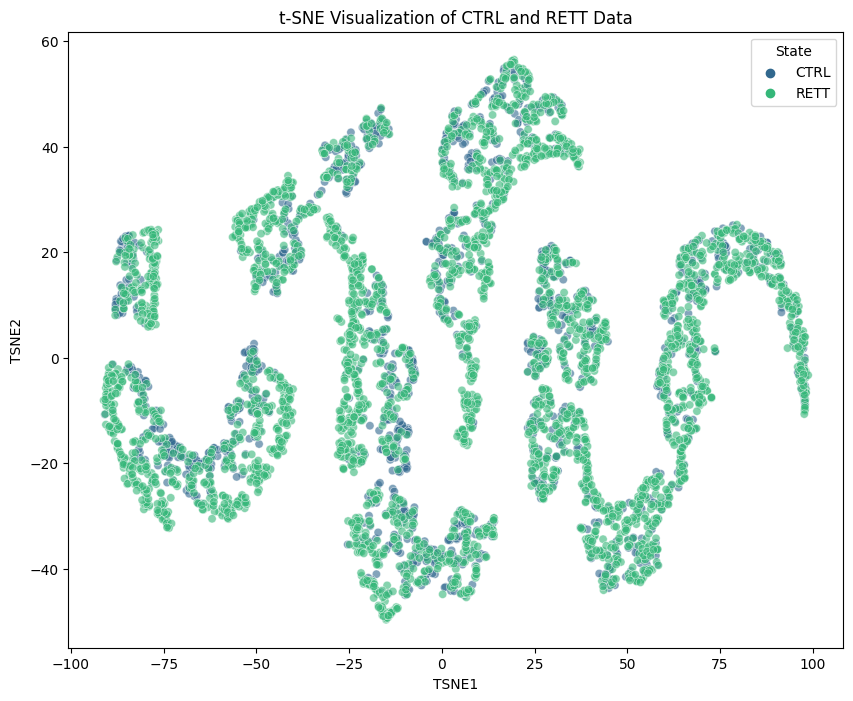

In [20]:
# Feature_GradCAM and Feature_ScoreCAM
for loadpath in ["Feature_GradCAM", "Feature_ScoreCAM"]:
    for stain_type in ["All", "H3K27ac", "CTCF", "Dapi"]:
        
        savename = f"Feature_{stain_type}"
        
        df_combined, df_RETT, df_CTRL = loadcsv(loadpath, stain_type)
        print("####################################################")
        print("####################################################")
        print("🛎️ ttest")
        from scipy.stats import ttest_ind
        # 初始化存储 p 值的列表
        p_values = []

        # 进行 t-检验
        for column in df_CTRL.columns[:-1]:  # 忽略 'State' 列
            t_stat, p_val = ttest_ind(
                df_CTRL[column], 
                df_RETT[column],
                equal_var=False  # 可以假设不等方差
            )
            p_values.append((column, p_val))

        # 将 p 值转化为 DataFrame
        p_values_df = pd.DataFrame(p_values, columns=['Feature', 'p_value'])

        # 筛选显著特征（例如 p < 0.05）
        significant_features = p_values_df[p_values_df['p_value'] < 0.02]

        # 按 p 值排序
        significant_features = significant_features.sort_values(by='p_value')

        # 打印显著特征
        print(significant_features)

        # 可视化显著特征的 p 值
        plt.figure(figsize=(16, 10))
        sns.barplot(x='p_value', y='Feature', data=significant_features, palette='viridis')
        plt.title('Significant Features Differentiating CTRL and RETT')
        plt.xlabel('p-value')
        plt.ylabel('Features')
        plt.axvline(x=0.02, color='r', linestyle='--')
        plt.savefig(f'{loadpath}/{savename}_ttest.png', dpi=300)
        plt.show()
        print("####################################################")
        print("####################################################")
        print("🛎️ PCA")
        
        from sklearn.decomposition import PCA
        # 提取特征数据
        features = df_combined.drop('State', axis=1)

        # 应用 PCA
        pca = PCA(n_components=2)
        principalComponents = pca.fit_transform(features)
        principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

        # 获取加载矩阵
        loading_matrix = pca.components_.T
        loading_df = pd.DataFrame(loading_matrix, columns=['PC1', 'PC2'], index=features.columns)

#         # 查看加载矩阵
#         print(loading_df)

        # 可视化加载矩阵
        plt.figure(figsize=(16, 12))
        sns.heatmap(loading_df, annot=True, cmap='coolwarm')
        plt.title('PCA Loading Matrix')
        plt.savefig(f'{loadpath}/{savename}_PCA_Matrix.png', dpi=300)
        plt.show()

        # 重置索引以确保对齐
        state_df = df_combined[['State']].reset_index(drop=True)
        finalDf = pd.concat([principalDf, state_df], axis=1)

        # 使用 Seaborn 绘制 PCA 结果图
        sns.scatterplot(data=finalDf, x='principal component 1', y='principal component 2', hue='State')
        plt.title('PCA of Dataset by State')
        plt.savefig(f'{loadpath}/{savename}_PCA.png', dpi=300)
        plt.show()
        print("####################################################")
        print("####################################################")
        print("🛎️ t-SNE")
        from sklearn.manifold import TSNE
        # 应用 t-SNE
        tsne = TSNE(n_components=2, random_state=42)
        tsne_results = tsne.fit_transform(df_combined.drop('State', axis=1))

        # 重置索引，确保索引的一致性
        tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2']).reset_index(drop=True)
        state_df = df_combined['State'].reset_index(drop=True)

        # 合并 t-SNE 结果和状态标签
        final_df = pd.concat([tsne_df, state_df], axis=1)

        # 绘制结果
        plt.figure(figsize=(10, 8))
        sns.scatterplot(x='TSNE1', y='TSNE2', hue='State', data=final_df, palette='viridis', alpha=0.6)
        plt.title('t-SNE Visualization of CTRL and RETT Data')

        plt.savefig(f'{loadpath}/{savename}_tSNE.png', dpi=300)
        plt.show()

🌸 Feature_image/features_RETT_H3K27ac.csv
🌼 Feature_image/features_CTRL_H3K27ac.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
21           Nucleus.Intensity.MeanMedianDiff  5.048859e-127
25                 Nucleus.Intensity.Skewness  6.173660e-126
36                Nucleus.Gradient.Canny.Mean   6.817652e-93
35                 Nucleus.Gradient.Canny.Sum   9.730107e-92
29                  Nucleus.Gradient.Mag.Mean   3.176850e-89
45                  Nucleus.Haralick.IDM.Mean   5.063888e-87
18                      Nucleus.Intensity.Max   1.125970e-86
27               Nucleus.Intensity.HistEnergy   1.105849e-78
28              Nucleus.Intensity.HistEntropy   2.166918e-77
55   Nucleus.Haralick.DifferenceVariance.Mean   1.046332e-76
57    Nucleus.Haralick.DifferenceEntropy.Mean   1.004641e-75
46                 Nucleus.Haralick.IDM.Range   1.039203e-71
39      

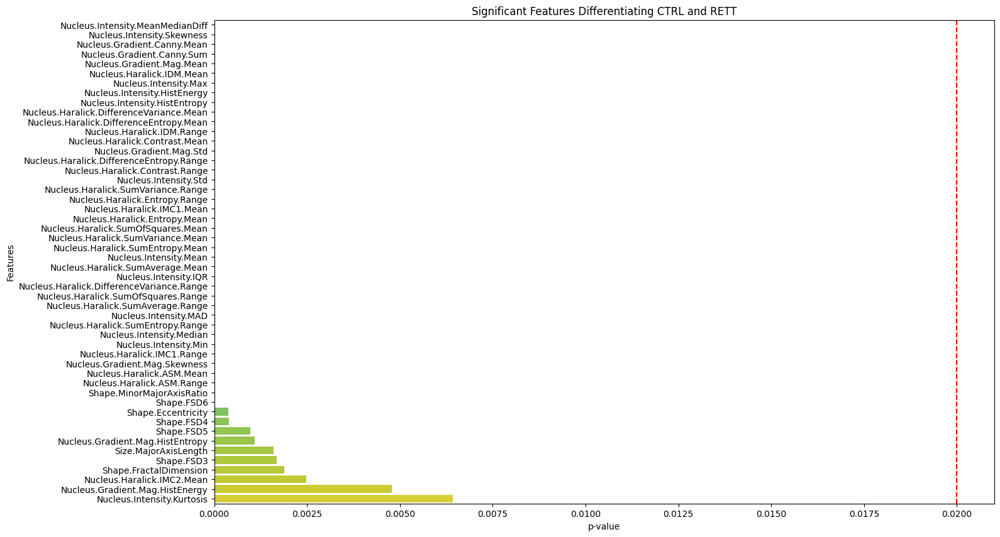

####################################################
####################################################
🛎️ PCA


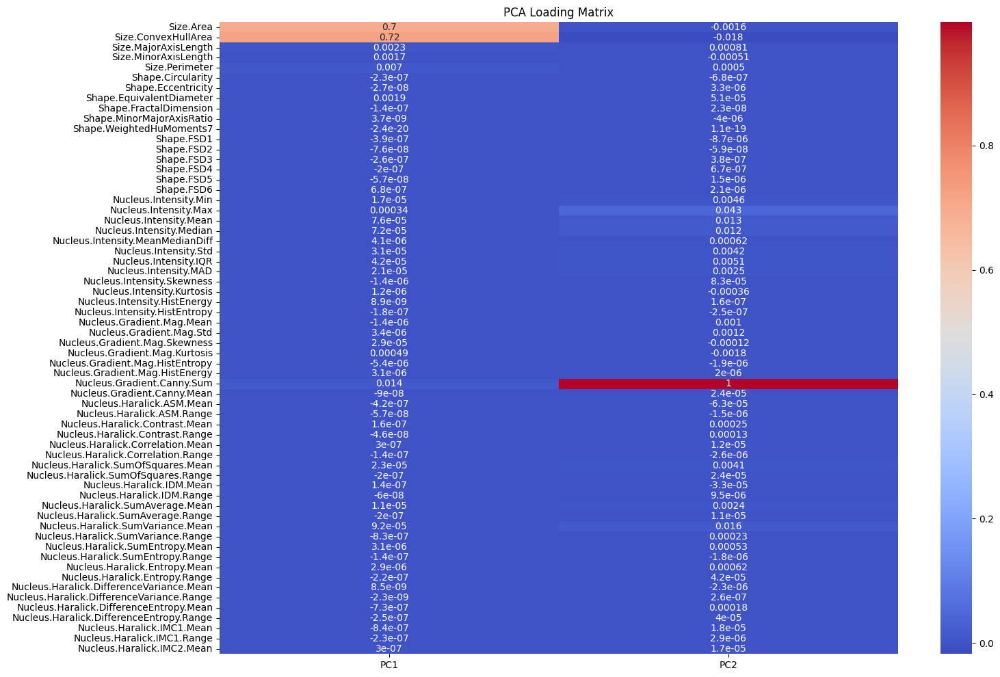

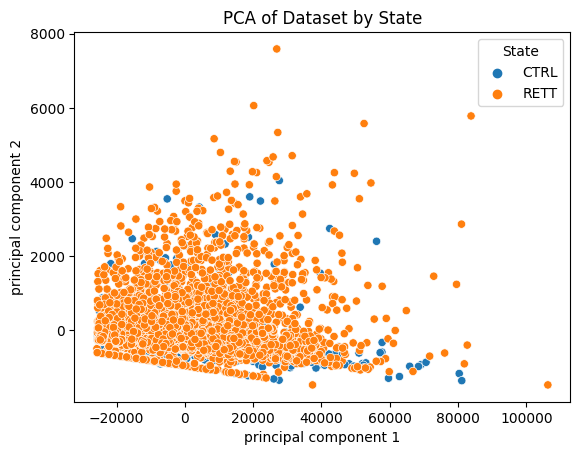

####################################################
####################################################
🛎️ t-SNE


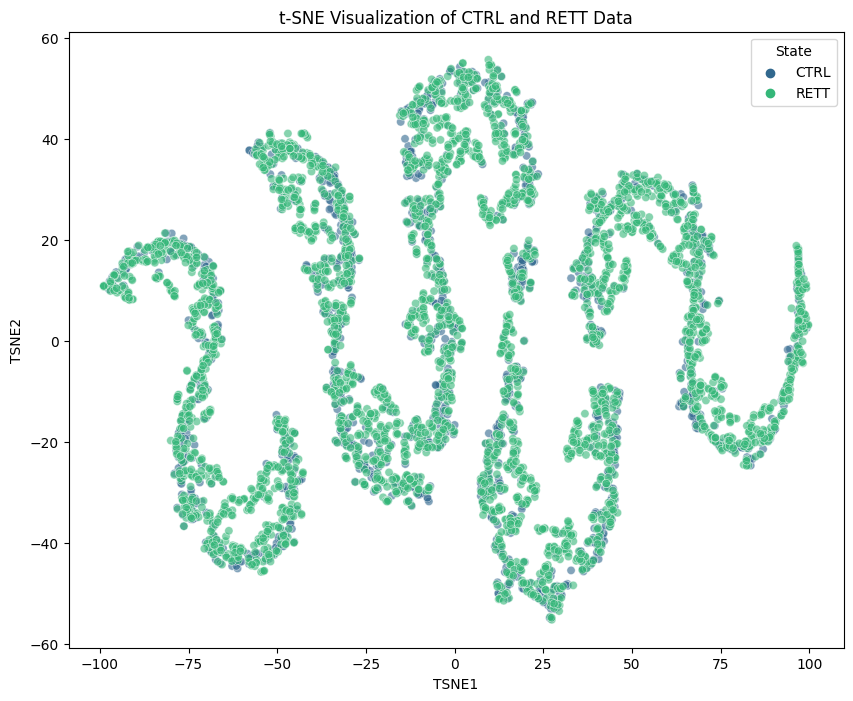

🌸 Feature_image/features_RETT_CTCF.csv
🌼 Feature_image/features_CTRL_CTCF.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
27               Nucleus.Intensity.HistEnergy  8.109028e-164
25                 Nucleus.Intensity.Skewness  1.190159e-160
28              Nucleus.Intensity.HistEntropy  5.163916e-148
41          Nucleus.Haralick.Correlation.Mean   5.058039e-40
42         Nucleus.Haralick.Correlation.Range   9.665881e-39
61                 Nucleus.Haralick.IMC2.Mean   5.713048e-38
24                      Nucleus.Intensity.MAD   1.347449e-37
23                      Nucleus.Intensity.IQR   2.832191e-34
56  Nucleus.Haralick.DifferenceVariance.Range   2.054820e-27
20                   Nucleus.Intensity.Median   7.199353e-27
47           Nucleus.Haralick.SumAverage.Mean   7.897208e-25
17                      Nucleus.Intensity.Min   1.954264e-24
19            

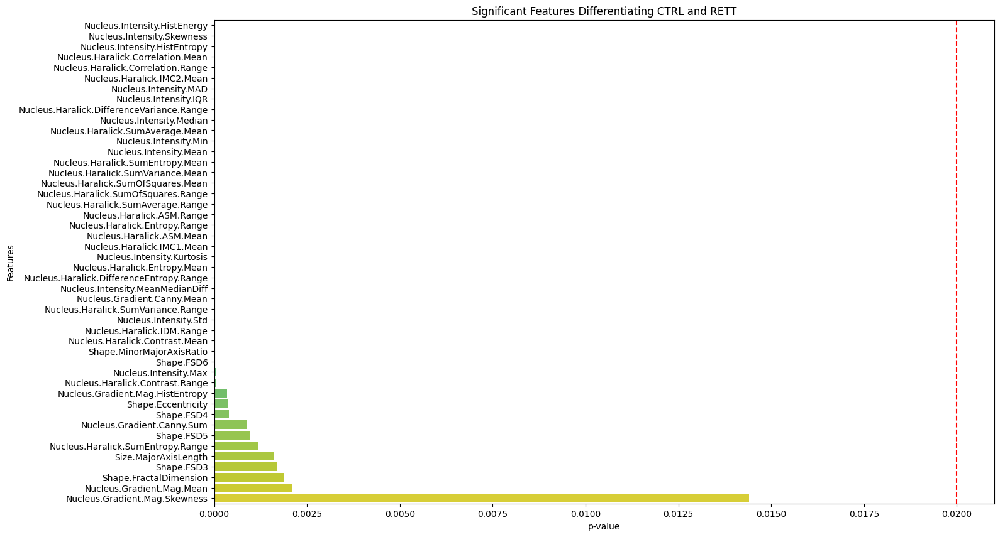

####################################################
####################################################
🛎️ PCA


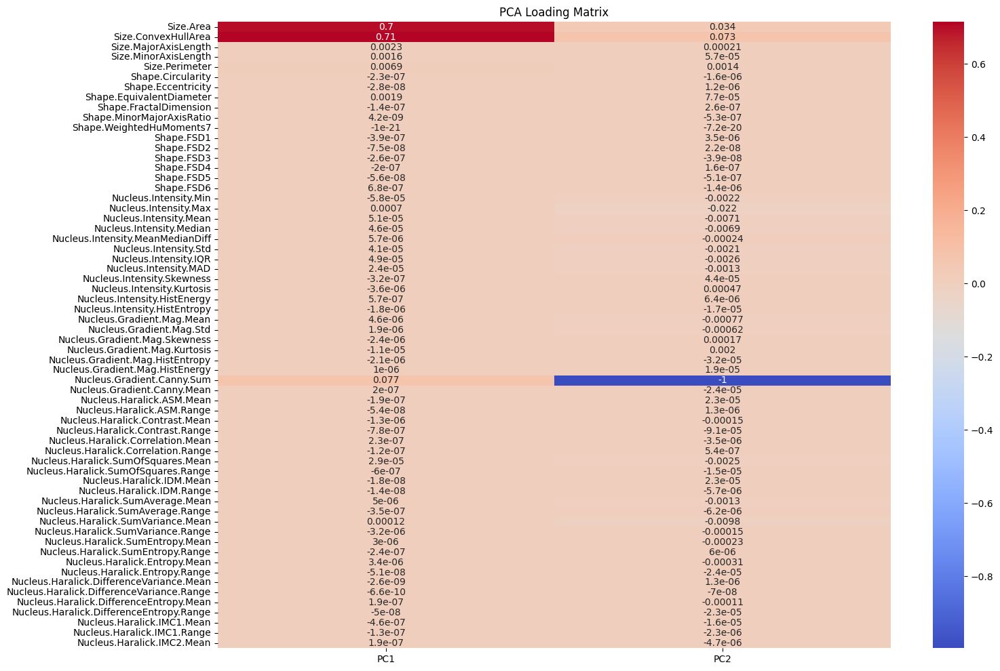

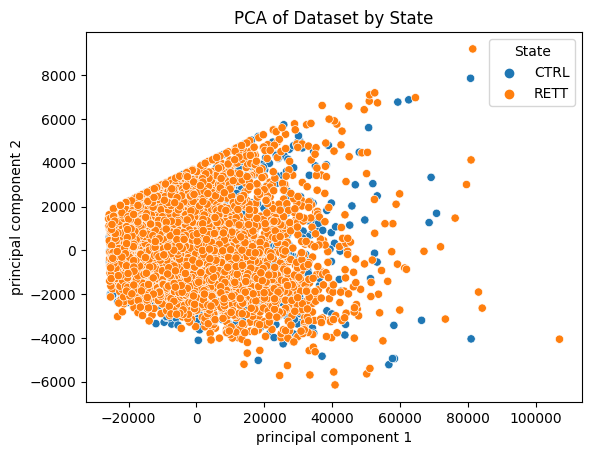

####################################################
####################################################
🛎️ t-SNE


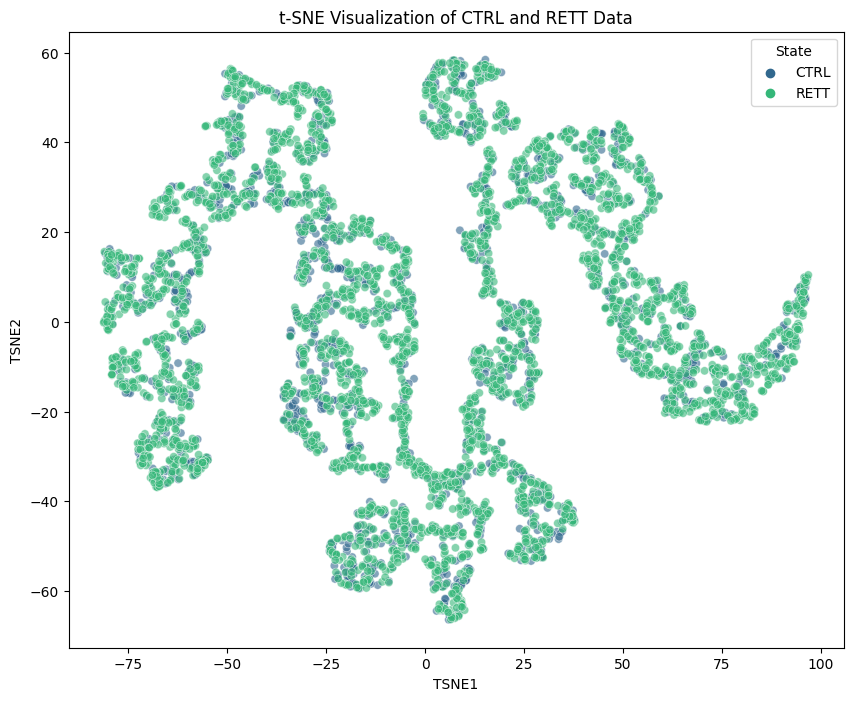

🌸 Feature_image/features_RETT_Dapi.csv
🌼 Feature_image/features_CTRL_Dapi.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
19                     Nucleus.Intensity.Mean  4.802859e-188
47           Nucleus.Haralick.SumAverage.Mean  8.658449e-188
20                   Nucleus.Intensity.Median  1.959602e-187
30                   Nucleus.Gradient.Mag.Std  3.538511e-169
29                  Nucleus.Gradient.Mag.Mean  4.900469e-167
17                      Nucleus.Intensity.Min  9.387352e-164
22                      Nucleus.Intensity.Std  3.501218e-160
48          Nucleus.Haralick.SumAverage.Range  1.390015e-156
24                      Nucleus.Intensity.MAD  6.365095e-145
23                      Nucleus.Intensity.IQR  2.517424e-144
45                  Nucleus.Haralick.IDM.Mean  6.544149e-143
53              Nucleus.Haralick.Entropy.Mean  1.728805e-133
46            

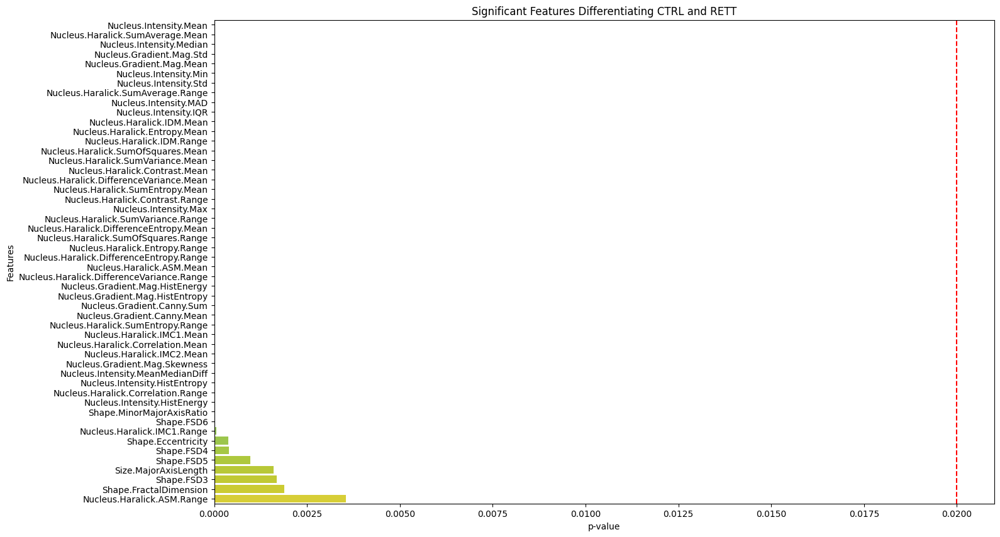

####################################################
####################################################
🛎️ PCA


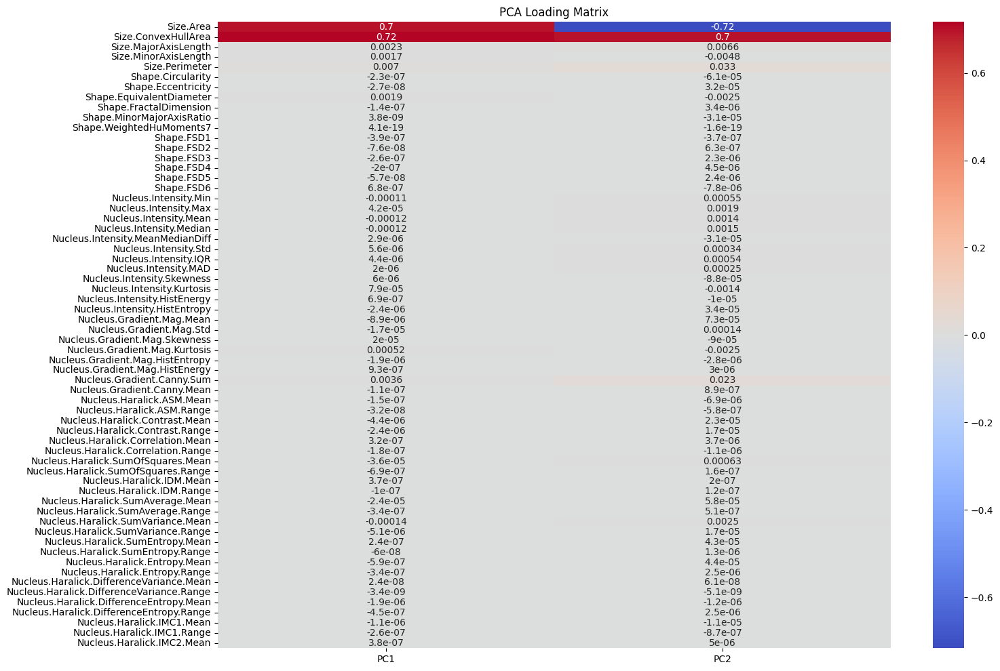

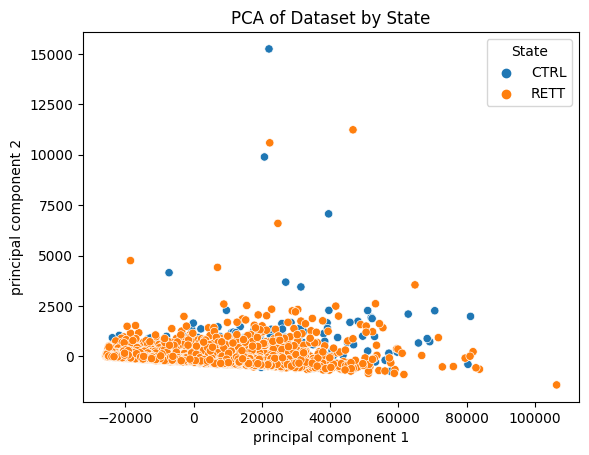

####################################################
####################################################
🛎️ t-SNE


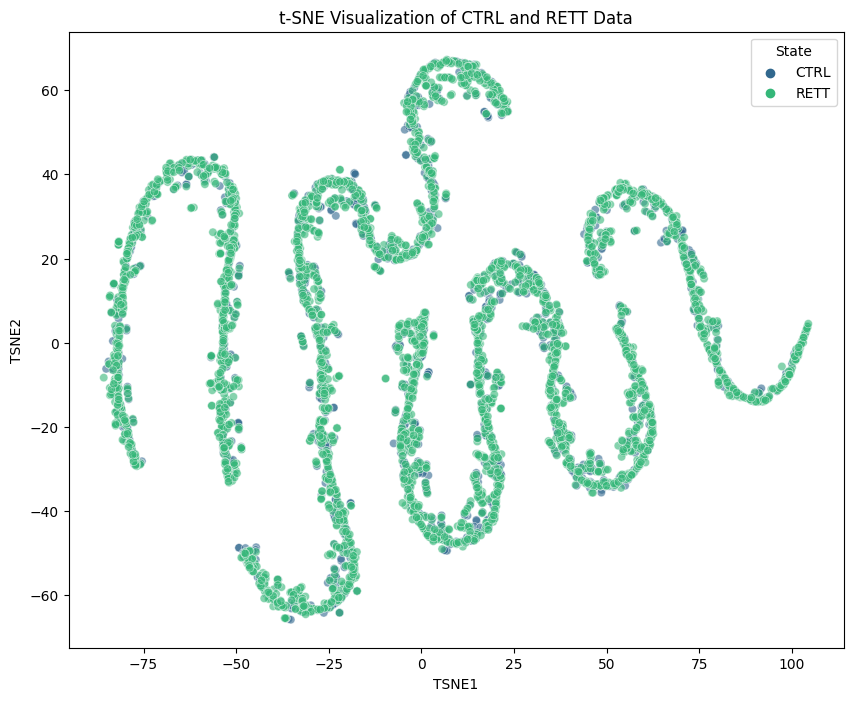

🌸 Feature_image_correct/features_RETT_H3K27ac_correct.csv
🌼 Feature_image_correct/features_CTRL_H3K27ac_correct.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
21           Nucleus.Intensity.MeanMedianDiff  2.388864e-131
25                 Nucleus.Intensity.Skewness  1.907773e-122
36                Nucleus.Gradient.Canny.Mean  6.866795e-102
35                 Nucleus.Gradient.Canny.Sum   1.888436e-98
29                  Nucleus.Gradient.Mag.Mean   2.220048e-95
18                      Nucleus.Intensity.Max   1.823443e-92
45                  Nucleus.Haralick.IDM.Mean   2.980866e-92
55   Nucleus.Haralick.DifferenceVariance.Mean   6.794576e-81
57    Nucleus.Haralick.DifferenceEntropy.Mean   6.430494e-80
46                 Nucleus.Haralick.IDM.Range   2.207285e-78
27               Nucleus.Intensity.HistEnergy   2.869159e-75
28              Nucleus.Intensity.His

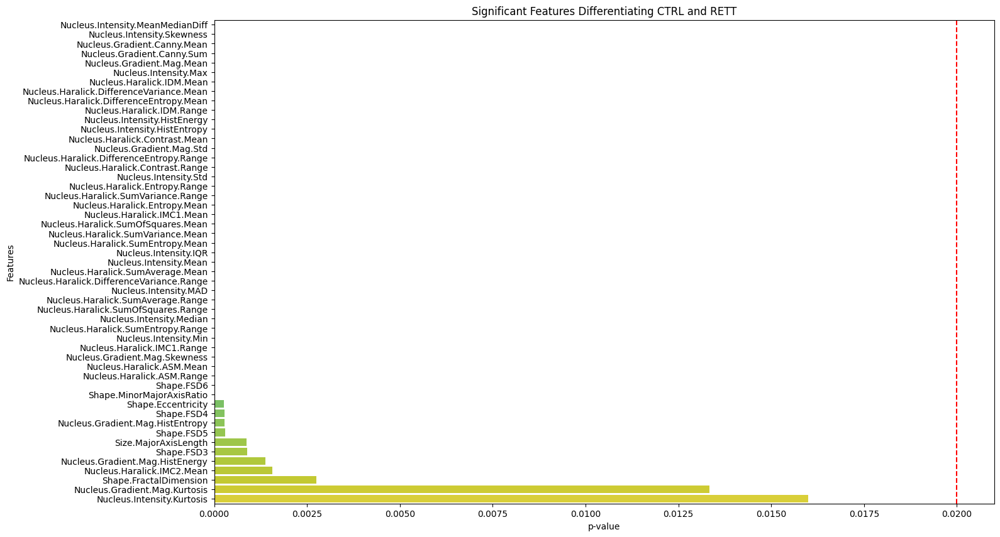

####################################################
####################################################
🛎️ PCA


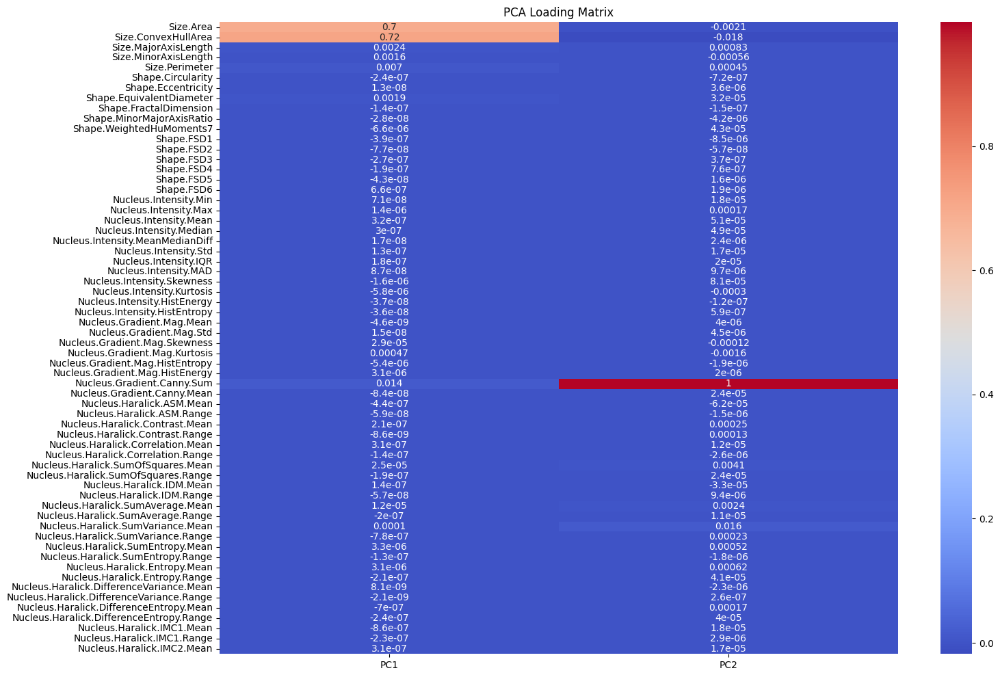

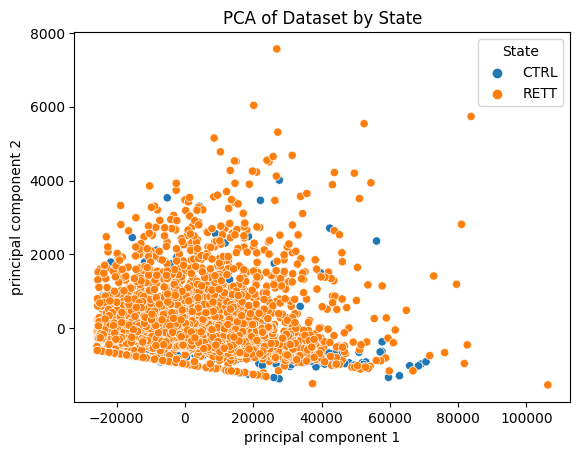

####################################################
####################################################
🛎️ t-SNE


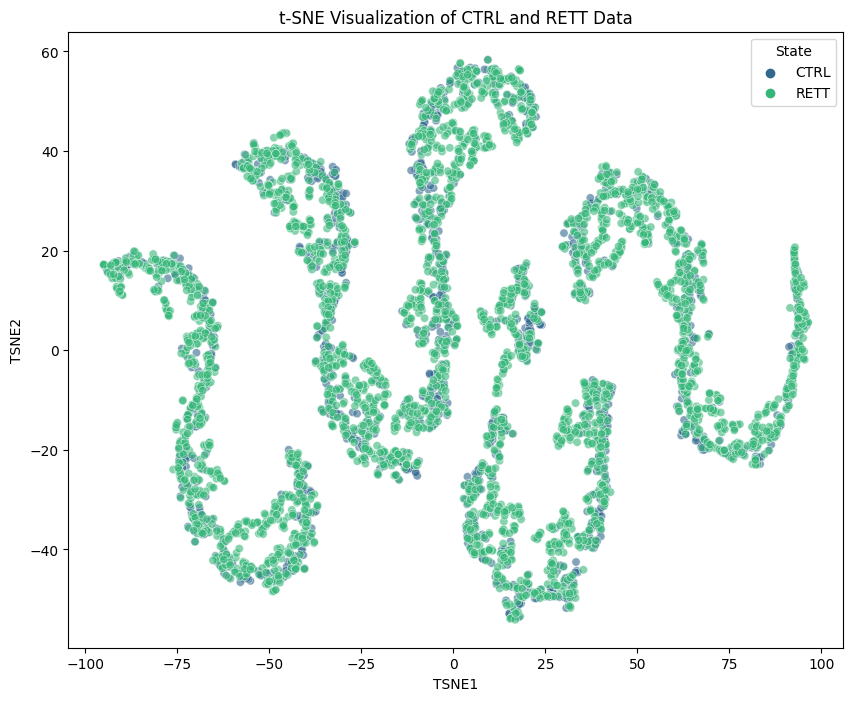

🌸 Feature_image_correct/features_RETT_CTCF_correct.csv
🌼 Feature_image_correct/features_CTRL_CTCF_correct.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
27               Nucleus.Intensity.HistEnergy  3.048796e-165
25                 Nucleus.Intensity.Skewness  1.112896e-158
28              Nucleus.Intensity.HistEntropy  4.268532e-149
41          Nucleus.Haralick.Correlation.Mean   2.511226e-42
42         Nucleus.Haralick.Correlation.Range   1.235124e-40
61                 Nucleus.Haralick.IMC2.Mean   5.433503e-40
24                      Nucleus.Intensity.MAD   1.249565e-38
23                      Nucleus.Intensity.IQR   1.161873e-35
20                   Nucleus.Intensity.Median   2.701640e-28
56  Nucleus.Haralick.DifferenceVariance.Range   4.181001e-28
47           Nucleus.Haralick.SumAverage.Mean   4.882681e-26
19                     Nucleus.Intensity.Me

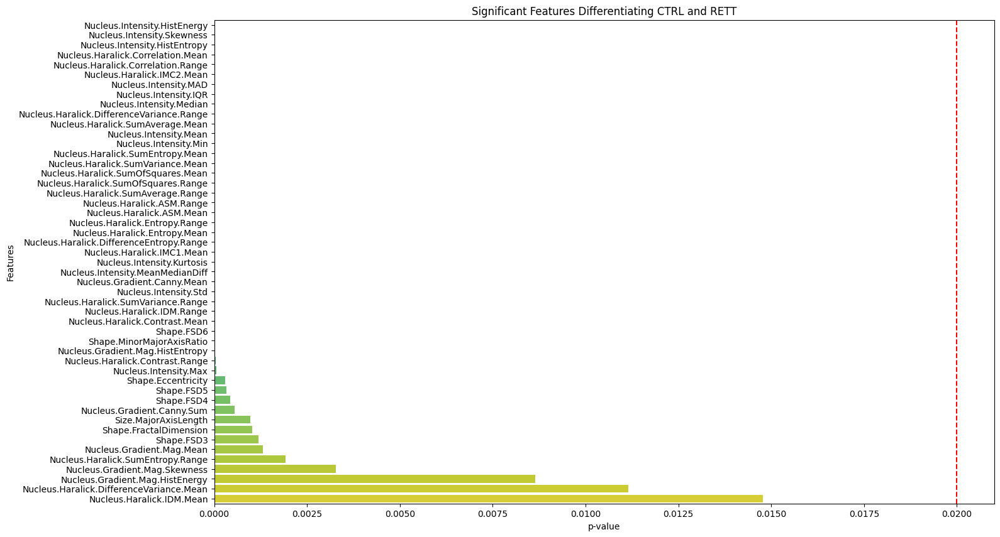

####################################################
####################################################
🛎️ PCA


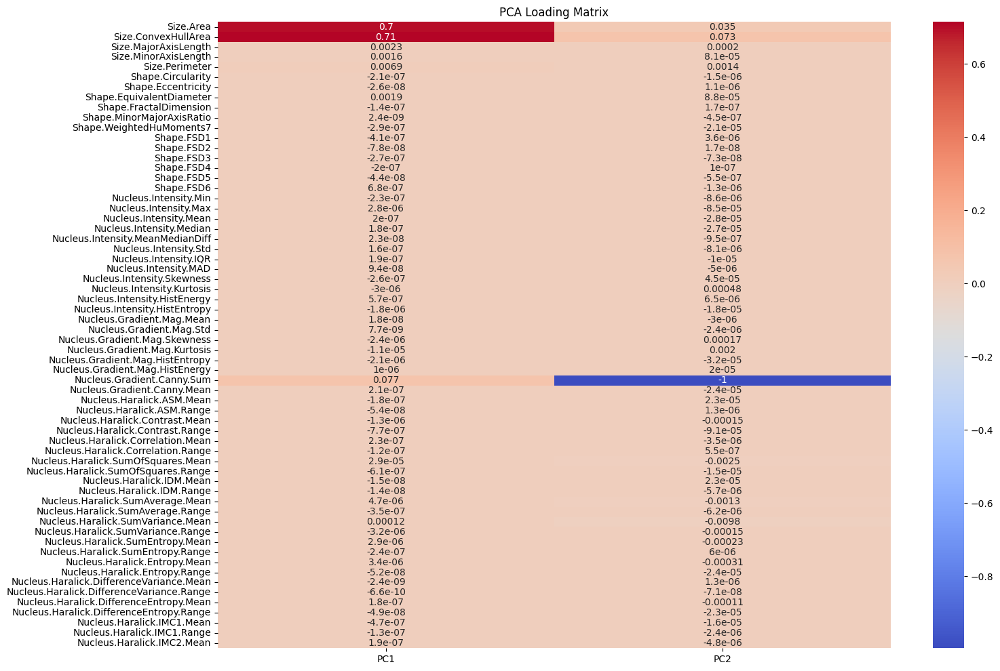

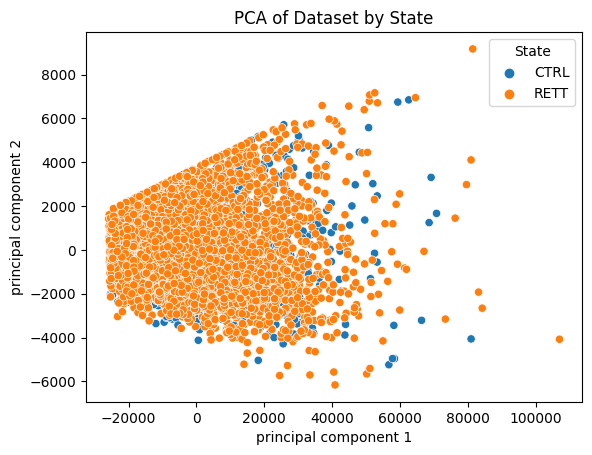

####################################################
####################################################
🛎️ t-SNE


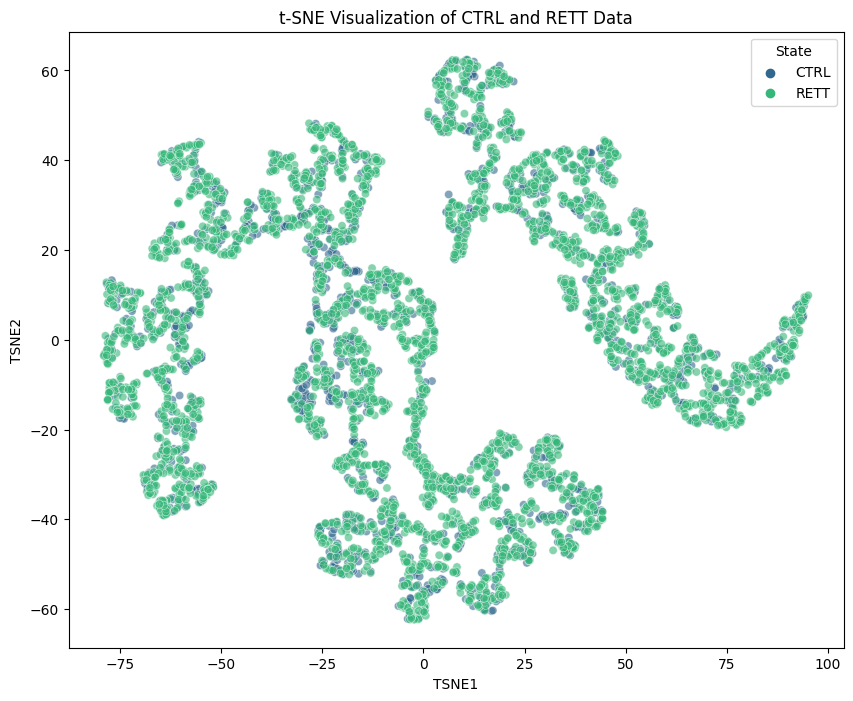

🌸 Feature_image_correct/features_RETT_Dapi_correct.csv
🌼 Feature_image_correct/features_CTRL_Dapi_correct.csv
####################################################
####################################################
🛎️ ttest
                                      Feature        p_value
19                     Nucleus.Intensity.Mean  1.962771e-192
20                   Nucleus.Intensity.Median  3.627595e-192
47           Nucleus.Haralick.SumAverage.Mean  7.694727e-191
30                   Nucleus.Gradient.Mag.Std  9.656759e-173
17                      Nucleus.Intensity.Min  3.588289e-170
29                  Nucleus.Gradient.Mag.Mean  7.964375e-169
48          Nucleus.Haralick.SumAverage.Range  1.633709e-159
22                      Nucleus.Intensity.Std  2.217119e-158
24                      Nucleus.Intensity.MAD  1.462271e-143
23                      Nucleus.Intensity.IQR  7.188133e-143
45                  Nucleus.Haralick.IDM.Mean  8.032376e-142
43         Nucleus.Haralick.SumOfSquares.Me

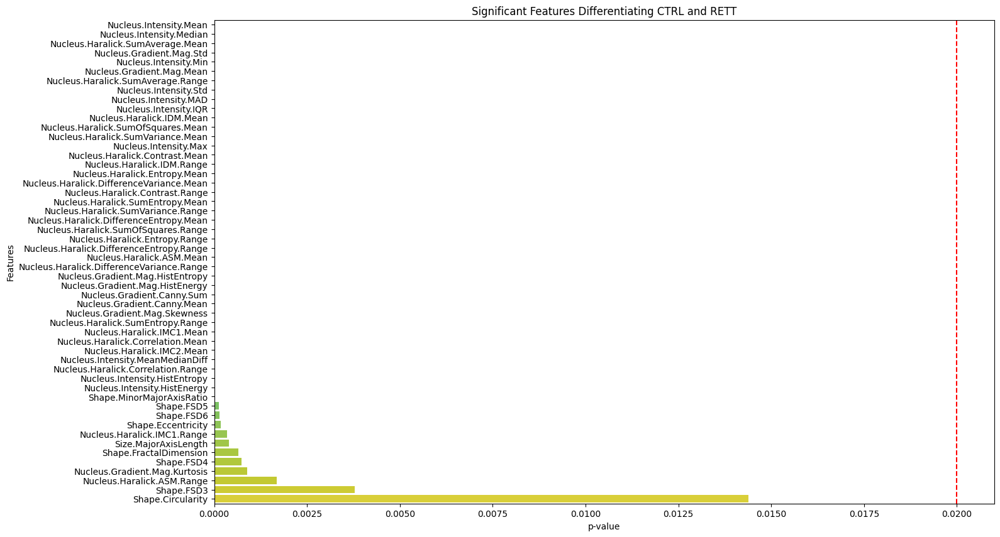

####################################################
####################################################
🛎️ PCA


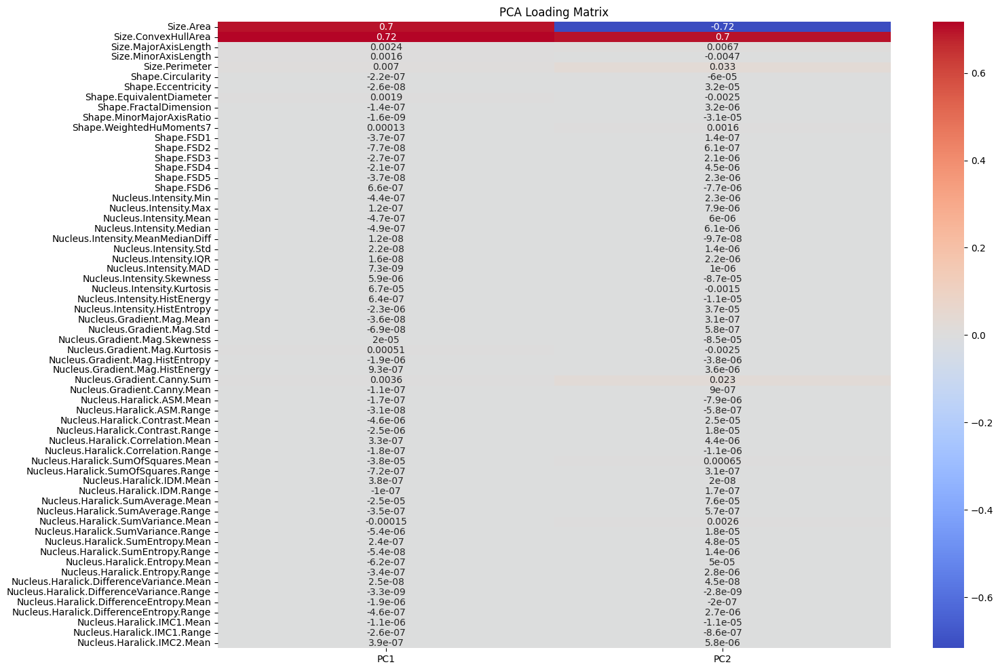

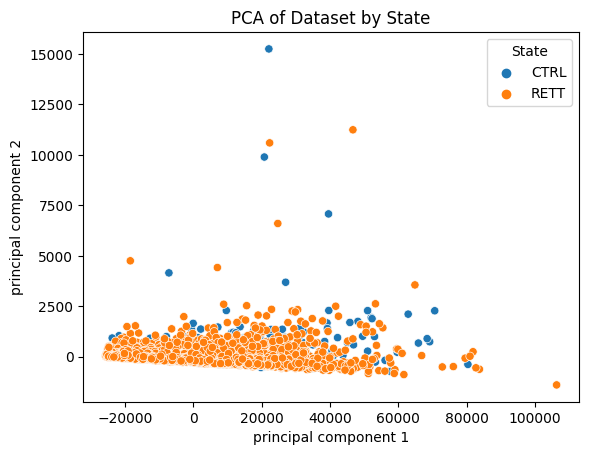

####################################################
####################################################
🛎️ t-SNE


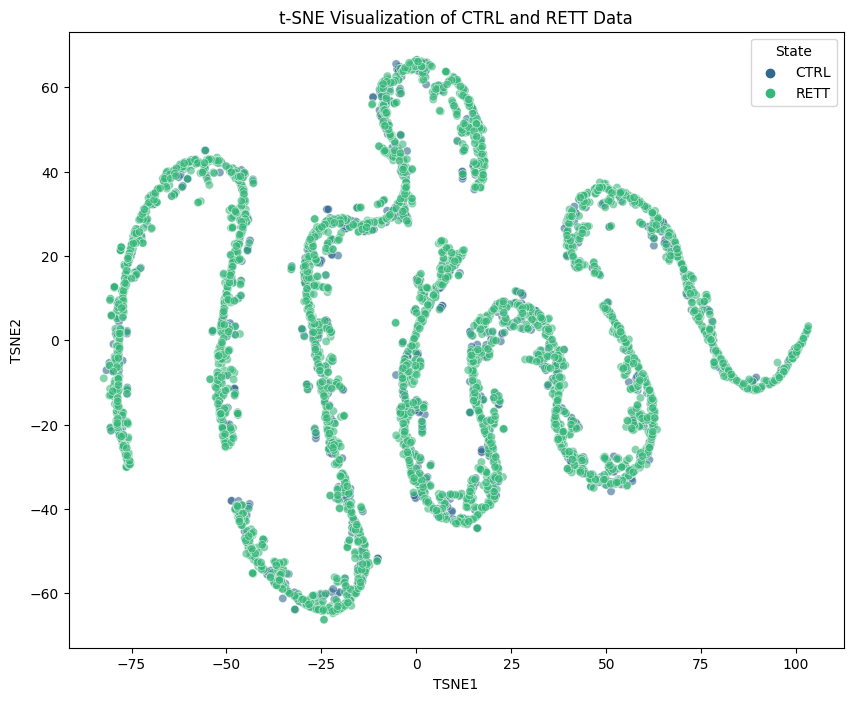

In [26]:
# Feature image
for loadpath in ["Feature_image", "Feature_image_correct"]:
    for stain_type in ["H3K27ac", "CTCF", "Dapi"]:
        savename = f"Feature_{stain_type}"
        
        df_combined, df_RETT, df_CTRL = loadcsv(loadpath, stain_type)
        print("####################################################")
        print("####################################################")
        print("🛎️ ttest")
        from scipy.stats import ttest_ind
        # 初始化存储 p 值的列表
        p_values = []

        # 进行 t-检验
        for column in df_CTRL.columns[:-1]:  # 忽略 'State' 列
            t_stat, p_val = ttest_ind(
                df_CTRL[column], 
                df_RETT[column],
                equal_var=False  # 可以假设不等方差
            )
            p_values.append((column, p_val))

        # 将 p 值转化为 DataFrame
        p_values_df = pd.DataFrame(p_values, columns=['Feature', 'p_value'])

        # 筛选显著特征（例如 p < 0.05）
        significant_features = p_values_df[p_values_df['p_value'] < 0.02]

        # 按 p 值排序
        significant_features = significant_features.sort_values(by='p_value')

        # 打印显著特征
        print(significant_features)

        # 可视化显著特征的 p 值
        plt.figure(figsize=(16, 10))
        sns.barplot(x='p_value', y='Feature', data=significant_features, palette='viridis')
        plt.title('Significant Features Differentiating CTRL and RETT')
        plt.xlabel('p-value')
        plt.ylabel('Features')
        plt.axvline(x=0.02, color='r', linestyle='--')
        plt.savefig(f'{loadpath}/{savename}_ttest.png', dpi=300)
        plt.show()
        print("####################################################")
        print("####################################################")
        print("🛎️ PCA")
        
        from sklearn.decomposition import PCA
        # 提取特征数据
        features = df_combined.drop('State', axis=1)

        # 应用 PCA
        pca = PCA(n_components=2)
        principalComponents = pca.fit_transform(features)
        principalDf = pd.DataFrame(data=principalComponents, columns=['principal component 1', 'principal component 2'])

        # 获取加载矩阵
        loading_matrix = pca.components_.T
        loading_df = pd.DataFrame(loading_matrix, columns=['PC1', 'PC2'], index=features.columns)

#         # 查看加载矩阵
#         print(loading_df)

        # 可视化加载矩阵
        plt.figure(figsize=(16, 12))
        sns.heatmap(loading_df, annot=True, cmap='coolwarm')
        plt.title('PCA Loading Matrix')
        plt.savefig(f'{loadpath}/{savename}_PCA_Matrix.png', dpi=300)
        plt.show()

        # 重置索引以确保对齐
        state_df = df_combined[['State']].reset_index(drop=True)
        finalDf = pd.concat([principalDf, state_df], axis=1)

        # 使用 Seaborn 绘制 PCA 结果图
        sns.scatterplot(data=finalDf, x='principal component 1', y='principal component 2', hue='State')
        plt.title('PCA of Dataset by State')
        plt.savefig(f'{loadpath}/{savename}_PCA.png', dpi=300)
        plt.show()
        print("####################################################")
        print("####################################################")
        print("🛎️ t-SNE")
        from sklearn.manifold import TSNE
        # 应用 t-SNE
        tsne = TSNE(n_components=2, random_state=42)
        tsne_results = tsne.fit_transform(df_combined.drop('State', axis=1))

        # 重置索引，确保索引的一致性
        tsne_df = pd.DataFrame(data=tsne_results, columns=['TSNE1', 'TSNE2']).reset_index(drop=True)
        state_df = df_combined['State'].reset_index(drop=True)

        # 合并 t-SNE 结果和状态标签
        final_df = pd.concat([tsne_df, state_df], axis=1)

        # 绘制结果
        plt.figure(figsize=(10, 8))
        sns.scatterplot(x='TSNE1', y='TSNE2', hue='State', data=final_df, palette='viridis', alpha=0.6)
        plt.title('t-SNE Visualization of CTRL and RETT Data')

        plt.savefig(f'{loadpath}/{savename}_tSNE.png', dpi=300)
        plt.show()